# Chronological Attribution of ancient texts using deep NNs

In [1]:
import pandas as pd
import numpy as np
import sys
import os

import matplotlib.pyplot as plt
import data_explore
import utils

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import tensorflow as tf

import keras
from keras.optimizers import SGD

import torch
import torch.nn as nn


from datetime import datetime
from time import time

import warnings
warnings.filterwarnings("ignore")



In [2]:
# Start time of Execution
time_start = time()

### Data Exploration & Preprocessing

In [3]:
# Retrieve data in DataFrame format
data = pd.read_csv('iphi2802.csv', sep= '\t')
df = pd.DataFrame(data)
# df = df.drop(columns=['id', 'metadata', 'date_str', 'date_circa', 'region_main', 'region_sub'])

#### Exploratory Data Analysis

In [4]:
df.head()

,id,text,metadata,region_main_id,region_main,region_sub_id,region_sub,date_str,date_min,date_max,date_circa
0,315181,[φ]ιλεταιρος ευμενου περγαμευς μουσαις. καφισι...,Boiotia — Thespiai — mid-3rd c. BC — BCH 26 (1...,1698,Central Greece (IG VII-IX),1691,"Megaris, Oropia, and Boiotia (IG VII)",mid-3rd c. BC,-275.0,-226.0,0.0
1,201686,μαλκοιδων ηρωνος.,"Crete, W. — Tarrha — 1st-3rd c. AD — IC II xxi...",1699,"Aegean Islands, incl. Crete (IG XI-[XIII])",474,Crete,1st-3rd c. AD,1.0,300.0,0.0
2,153178,βασιλικος.,Makedonia (Bottiaia) — Pella — 3rd/2nd c. BC —...,1692,Northern Greece (IG X),1485,Macedonia,3rd/2nd c. BC,-300.0,-101.0,0.0
3,28582,αισκλαπιει μ [ανεθεκε --].,Epidauria — Epidauros — sinistr. — 6th/5th c. BC,1690,Peloponnesos (IG IV-[VI]),1643,"Epidauria (IG IV²,1)",6th/5th c. BC,-600.0,-401.0,0.0
4,333620,[---]ος αν[εθηκε δαματρι].,Italia — Herakleia (Policoro) — late 4th/early...,1696,"Sicily, Italy, and the West (IG XIV)",1689,"Italy, incl. Magna Graecia",late 4th/early 3rd c. BC,-350.0,-251.0,0.0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2802 entries, 0 to 2801
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              2802 non-null   int64  
 1   text            2802 non-null   object 
 2   metadata        2802 non-null   object 
 3   region_main_id  2802 non-null   int64  
 4   region_main     2802 non-null   object 
 5   region_sub_id   2802 non-null   int64  
 6   region_sub      2802 non-null   object 
 7   date_str        2802 non-null   object 
 8   date_min        2802 non-null   float64
 9   date_max        2802 non-null   float64
 10  date_circa      2802 non-null   float64
dtypes: float64(3), int64(3), object(5)
memory usage: 240.9+ KB


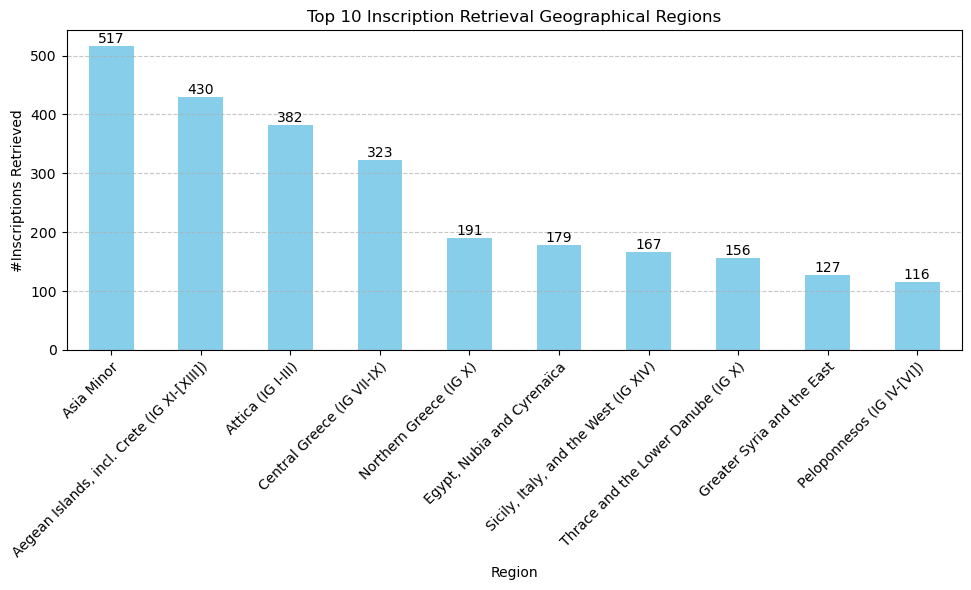

In [6]:
# Locations' dictionaries
region_main_dict = {key: value for key, value in zip(df['region_main_id'], df['region_main'])}
region_sub_dict = {key: value for key, value in zip(df['region_sub_id'], df['region_sub'])}
region_dict = {
    'region_main_dict': region_main_dict,
    'region_sub_dict': region_sub_dict
}
# Plot epigraph location frequency histogram
plt.figure(figsize=(10, 6))
bars = df['region_main_id'].value_counts().head(10).plot(kind='bar', color='skyblue')
plt.title('Top 10 Inscription Retrieval Geographical Regions')
plt.xlabel('Region')
plt.ylabel('#Inscriptions Retrieved')
plt.xticks(range(len(df['region_main_id'].value_counts().head(10))), [region_main_dict[key] for key in df['region_main_id'].value_counts().head(10).index], rotation=45, ha='right', rotation_mode='anchor')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in bars.patches:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(int(bar.get_height())), ha='center', va='bottom')

plt.tight_layout()

plt.show()

#### Data Preprocessing - Text Encoding (Tokenization/Vectorization) / Scaling

In [7]:
# extracting features - predictors
text = df['text'].tolist()
region_main = df['region_main_id']
region_sub = df['region_sub_id']
# extracting labels
date_min  = df['date_min'].tolist()
date_max = df['date_max'].tolist()

# for usage on determing the features' selection in vectorization using ANOVA
df = df.assign(date_mean=(df['date_min'] + df['date_max']) / 2)
date_mean = df['date_mean']

labels_df = pd.DataFrame({
    'date_min': date_min,
    'date_max': date_max
})

In [8]:
text[0]

'[φ]ιλεταιρος ευμενου περγαμευς μουσαις. καφισιας εποιησε.'

Average number of words per sample: 7.0
Total number of ngrams: 81315


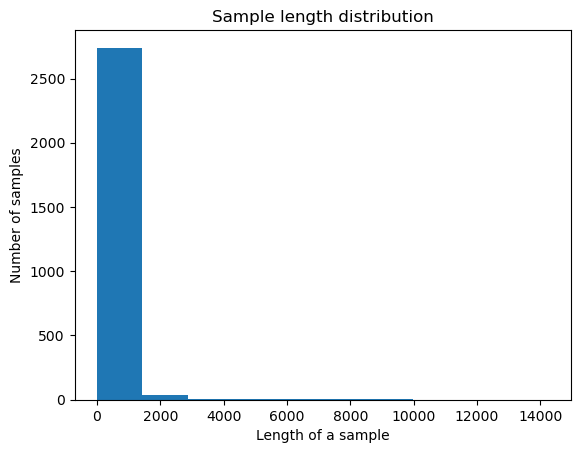

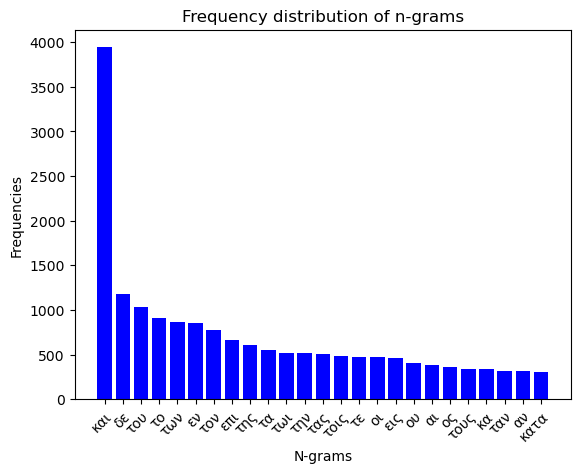

In [9]:
ave, ngrams = data_explore.get_num_words_per_sample(text)
print(f'Average number of words per sample: {ave}')
print(f'Total number of ngrams: {ngrams}')

# plot sample length distribution
data_explore.plot_sample_length_distribution(text)

# plot frequency distribution of ngrams
data_explore.plot_frequency_distribution_of_ngrams(text)

In [10]:
print(f'Total Samples / Average Number of Words per Sample = {2802/ave:.2f}')

Total Samples / Average Number of Words per Sample = 400.29


In [11]:
# Split data
X_train, X_test, labels_train, labels_test = train_test_split(text, labels_df, test_size=.3, random_state=42) 

In [12]:
# Text vectorization
X_train_vect, X_test_vect = utils.ngram_vectorize(X_train, X_test)


Tokens[:40]: ['αα' 'αγ' 'αγα' 'αγαθ' 'αγαθα' 'αγαθαι' 'αγαθαι τυχαι' 'αγαθει'
 'αγαθει τυχει' 'αγαθη' 'αγαθη τυχη' 'αγαθηι' 'αγαθηι τυχηι' 'αγαθοκλης'
 'αγαθον' 'αγαθος' 'αγαθους' 'αγαθων' 'αγαλμα' 'αγησαρχου'
 'αγησαρχου δελφου' 'αγια' 'αγιου' 'αγω' 'αγων' 'αγωνα' 'αγωνι'
 'αγωνοθετην' 'αγωνος' 'αδ' 'αδελφον' 'αδελφω' 'αδριανος'
 'αδριανος σεβαστος' 'αδριανου' 'αδριανω' 'αει' 'αθ' 'αθανα' 'αθαναι']

Number of tokens: 2000

Stop words: None


In [13]:
print(f'Train Set size: {X_train_vect.shape}, Test Set size: {X_test_vect.shape}')

Train Set size: (1961, 2000), Test Set size: (841, 2000)


### Scaling

In [14]:
# Scaling labels
scaler = MaxAbsScaler()

# Fit scaler to new_df
scaler.fit(labels_train)

# Transform new_df using the scaler
scaled_labels_train = scaler.transform(labels_train)
scaled_labels_test = scaler.transform(labels_test)

In [15]:
scaled_labels_train.shape

(1961, 2)

# Neural Network

In [16]:
# Custom RMSE function
def rmse_custom(y_true, y_pred):
    e = tf.where(
        y_pred[:, 0] < y_true[:, 0],
        y_true[:, 0] - y_pred[:, 0],
        tf.where(
            y_pred[:, 1] > y_true[:, 1],
            y_pred[:, 1] - y_true[:, 1],
            tf.zeros_like(y_pred[:, 0])
        )
    )
    return tf.sqrt(tf.reduce_mean(tf.square(e)))

### NN(2000, {1:16}, 2)


Epoch 1: val_loss improved from inf to 0.14213, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.14213 to 0.11148, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.11148 to 0.08893, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.08893 to 0.07235, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.07235 to 0.06003, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.06003 to 0.05038, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.05038 to 0.04258, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.04258 to 0.03640, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.03640 to 0.03141, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.03141 to 0.02708, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.02708 to 0.02347, saving model to bes

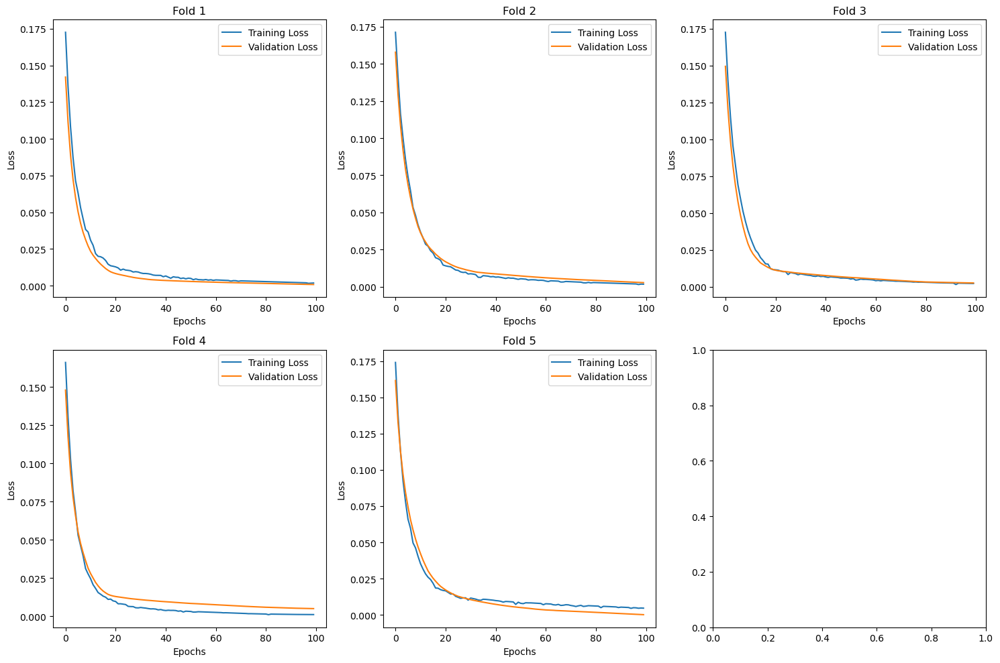

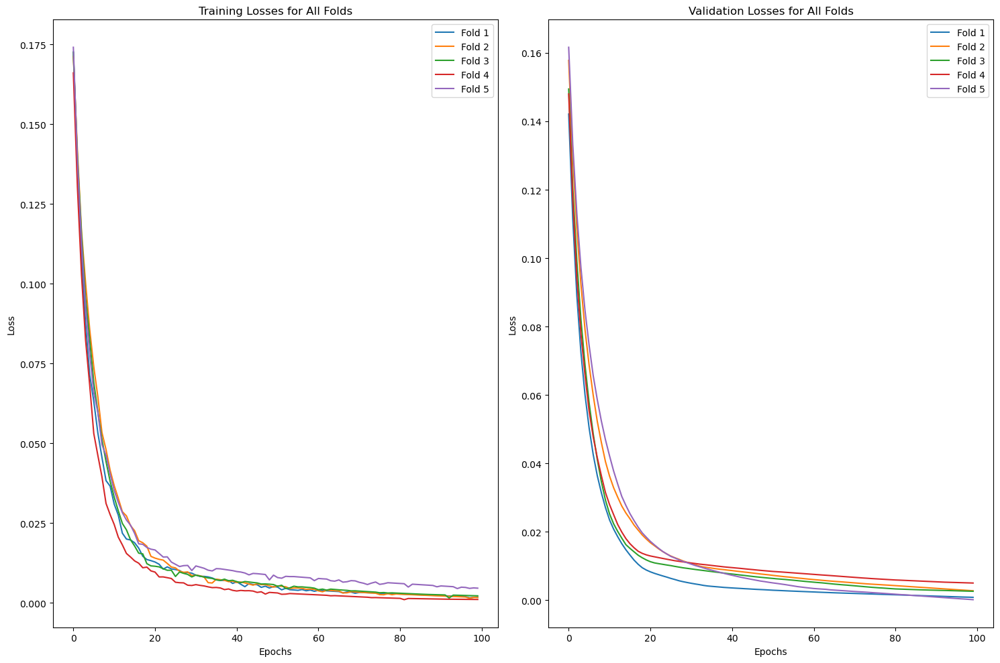

Best model index: 5, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_1.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_10 (Dense)                │ (None, 16)             │        32,016 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 2)              │            34 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,052 (125.21 KB)

 Trainable params: 32,050 (125.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [17]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(16, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(16, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [18]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013     


0.0022501724306493998

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


Overall Mean Loss: 0.731


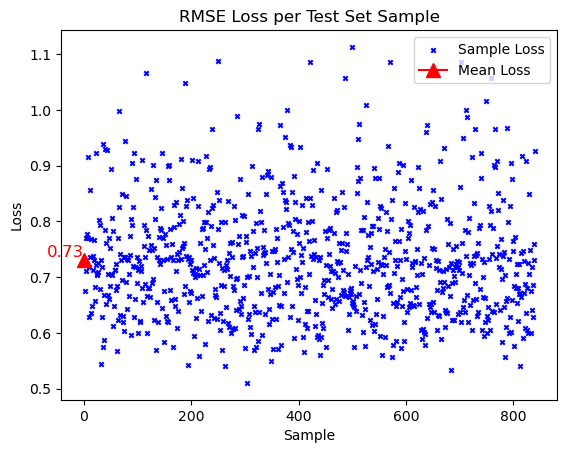

In [19]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')

# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()



### NN(2000, {1:32}, 2)


Epoch 1: val_loss improved from inf to 0.14875, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.14875 to 0.12277, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.12277 to 0.10200, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.10200 to 0.08581, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.08581 to 0.07266, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.07266 to 0.06202, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.06202 to 0.05330, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.05330 to 0.04602, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.04602 to 0.03973, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.03973 to 0.03450, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.03450 to 0.02989, saving model to bes

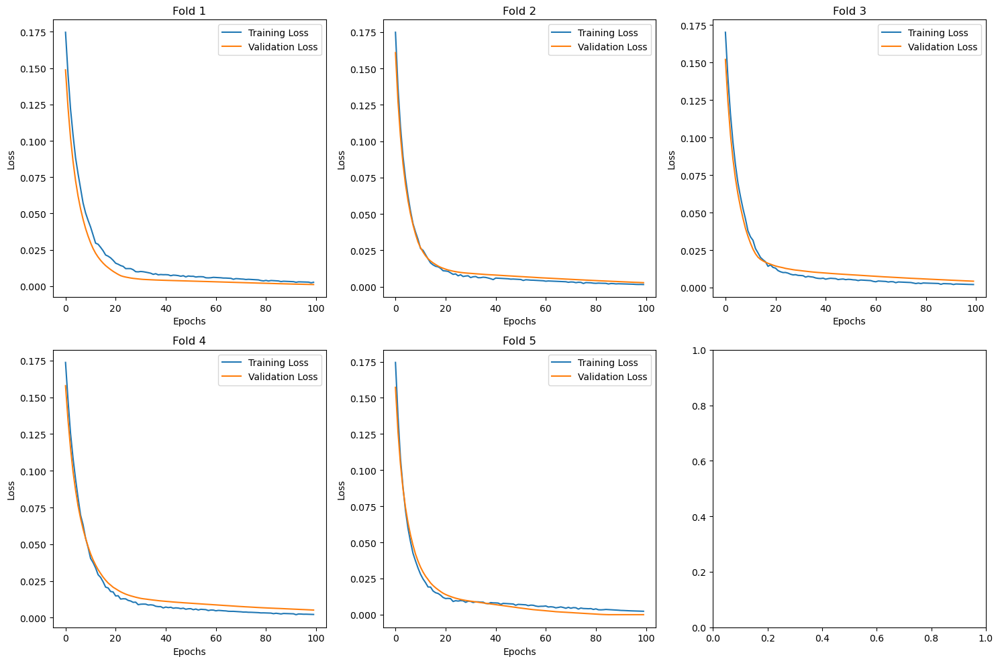

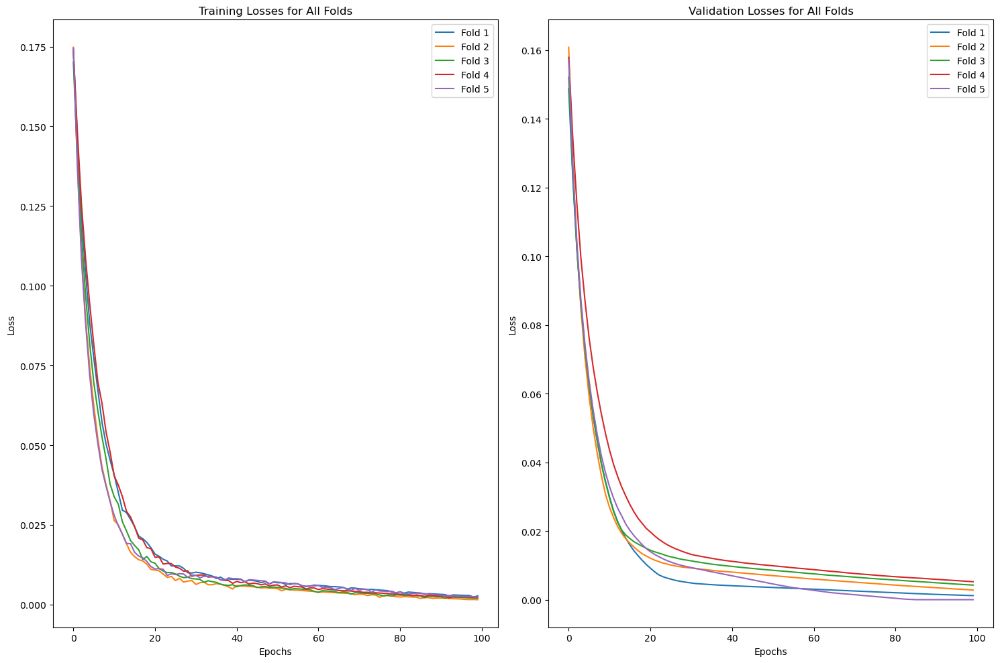

Best model index: 5, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_1.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_22 (Dense)                │ (None, 32)             │        64,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 64,100 (250.39 KB)

 Trainable params: 64,098 (250.38 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [20]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(32, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(32, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [21]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 0.0016   


0.003140808315947652

In [22]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Overall Mean Loss: 0.741


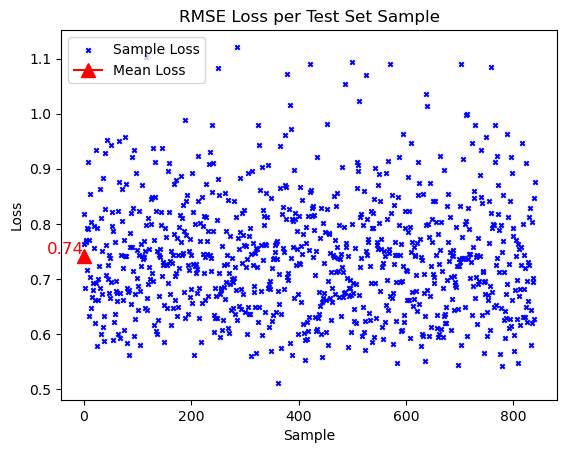

In [23]:

# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:64}, 2)


Epoch 1: val_loss improved from inf to 0.14902, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.14902 to 0.11946, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.11946 to 0.09653, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.09653 to 0.07859, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.07859 to 0.06444, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.06444 to 0.05346, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.05346 to 0.04455, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.04455 to 0.03718, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.03718 to 0.03160, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.03160 to 0.02681, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.02681 to 0.02314, saving model to bes

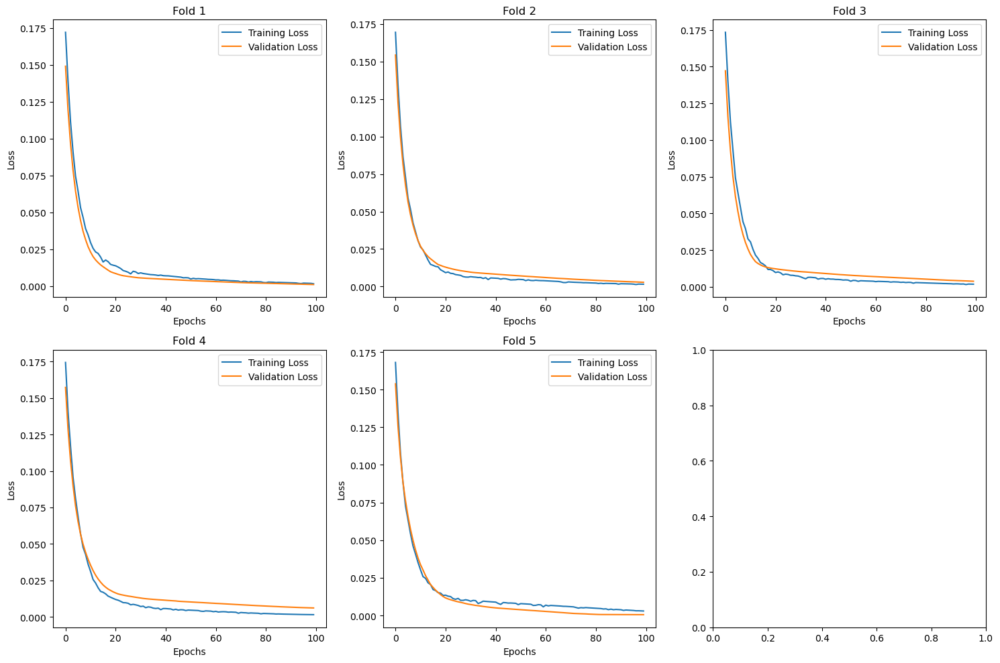

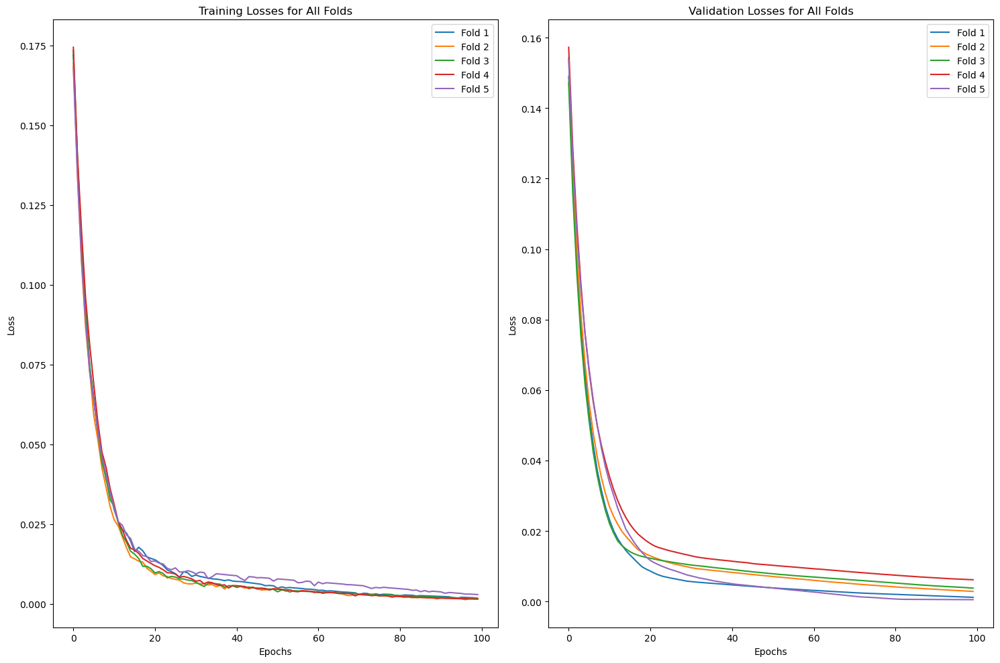

Best model index: 5, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_1.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_34 (Dense)                │ (None, 64)             │       128,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 128,196 (500.77 KB)

 Trainable params: 128,194 (500.76 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [24]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [25]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 0.0011   


0.001976417377591133

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step
Overall Mean Loss: 0.775


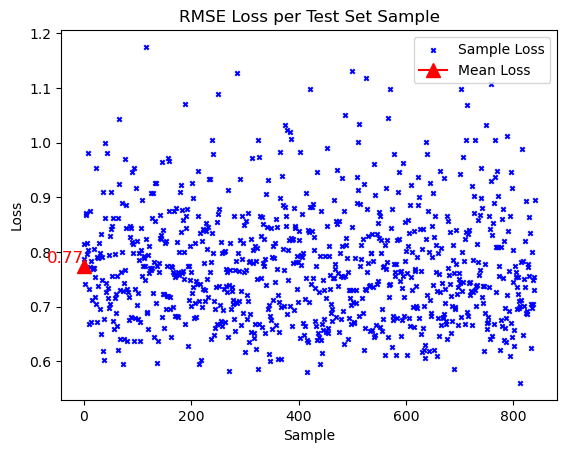

In [26]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:128}, 2)


Epoch 1: val_loss improved from inf to 0.14518, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.14518 to 0.11421, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.11421 to 0.09101, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.09101 to 0.07333, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.07333 to 0.05978, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.05978 to 0.04912, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.04912 to 0.04033, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.04033 to 0.03299, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.03299 to 0.02675, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.02675 to 0.02177, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.02177 to 0.01779, saving model to bes

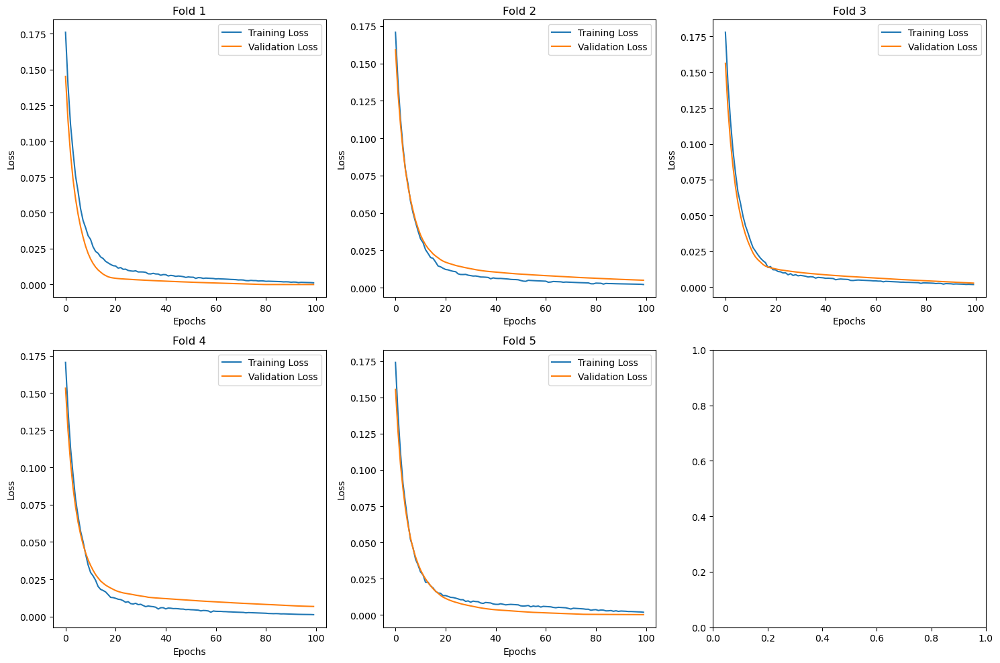

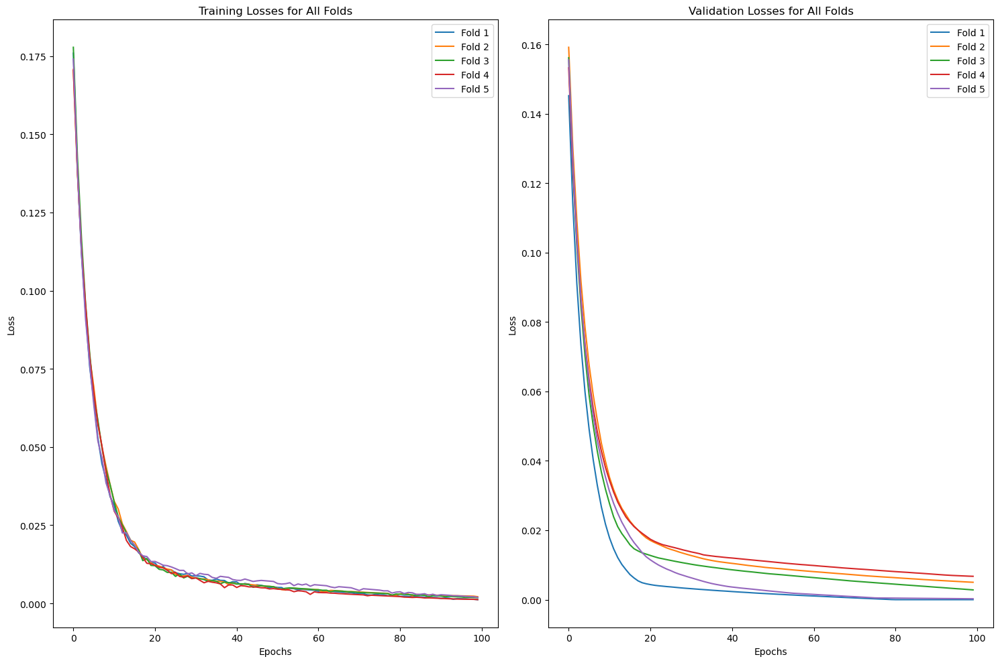

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_46 (Dense)                │ (None, 128)            │       256,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 256,388 (1001.52 KB)

 Trainable params: 256,386 (1001.51 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [27]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(128, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(128, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [28]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 647us/step - loss: 0.0013   


0.002117495285347104

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


Overall Mean Loss: 0.772


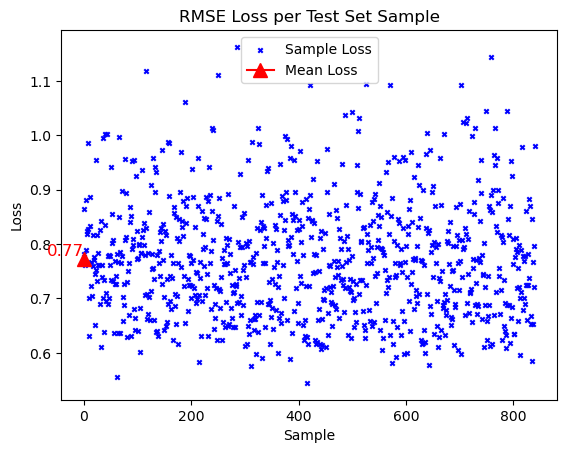

In [29]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:16, 1:8}, 2)


Epoch 1: val_loss improved from inf to 0.11953, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.11953 to 0.08371, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.08371 to 0.06176, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.06176 to 0.04715, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.04715 to 0.03647, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.03647 to 0.02933, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.02933 to 0.02335, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.02335 to 0.01880, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.01880 to 0.01537, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.01537 to 0.01300, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.01300 to 0.01096, saving model to bes

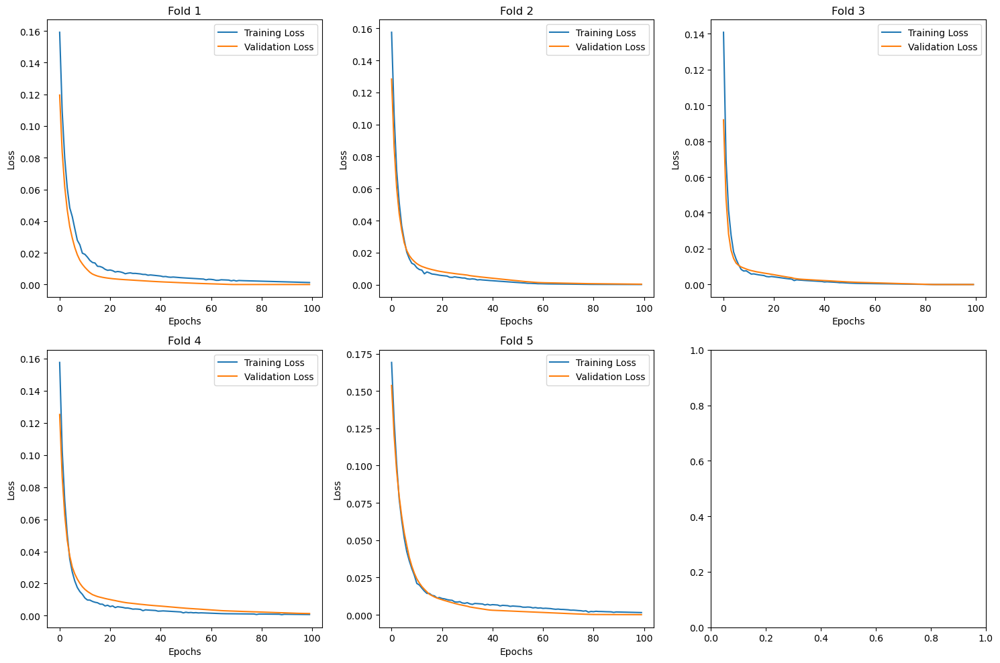

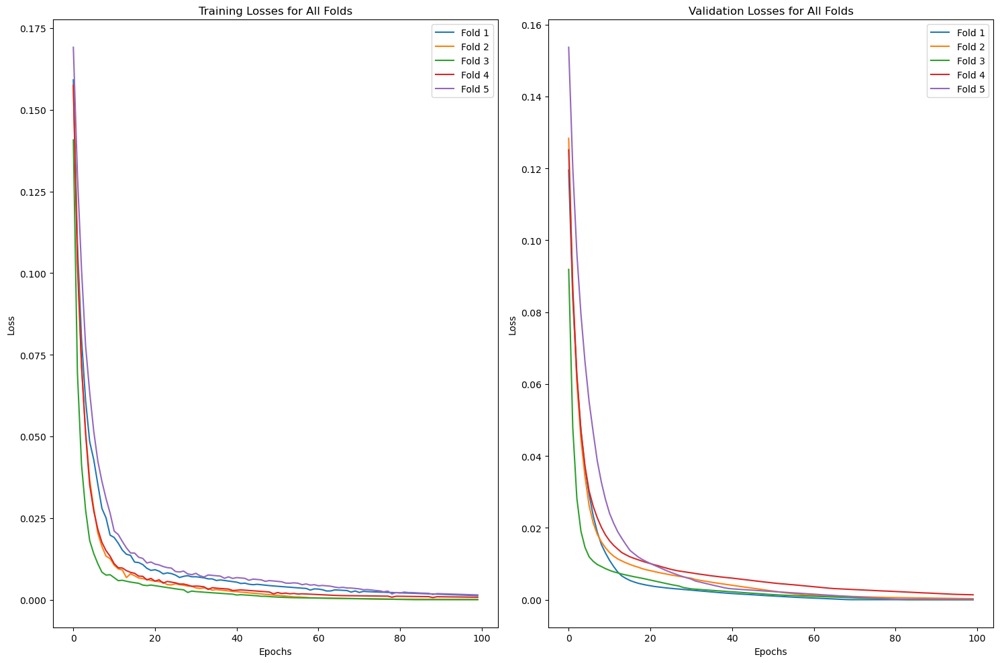

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 16)             │        32,016 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 2)              │            18 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,172 (125.68 KB)

 Trainable params: 32,170 (125.66 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [30]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(16, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(8, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(16, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(8, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [31]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 8.8708e-04


0.0015435311943292618

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Overall Mean Loss: 0.795


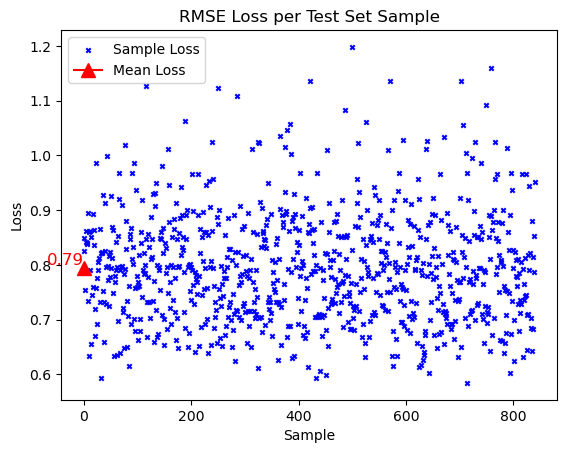

In [32]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:16, 2:32}, 2)


Epoch 1: val_loss improved from inf to 0.15028, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.15028 to 0.12518, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.12518 to 0.10494, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.10494 to 0.08823, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.08823 to 0.07446, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.07446 to 0.06341, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.06341 to 0.05424, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.05424 to 0.04636, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.04636 to 0.03961, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.03961 to 0.03382, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.03382 to 0.02869, saving model to bes

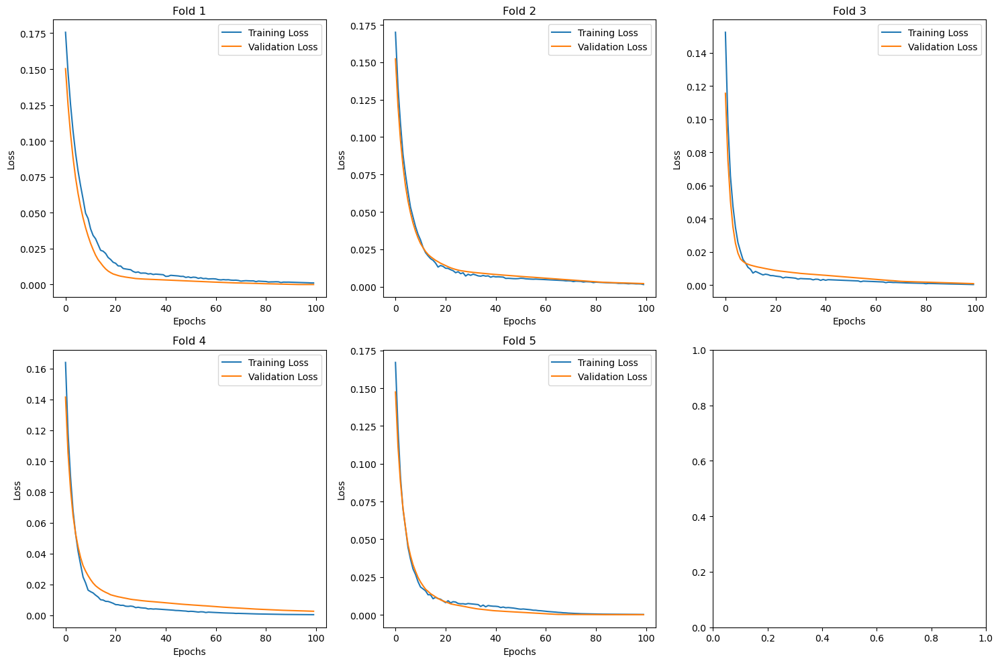

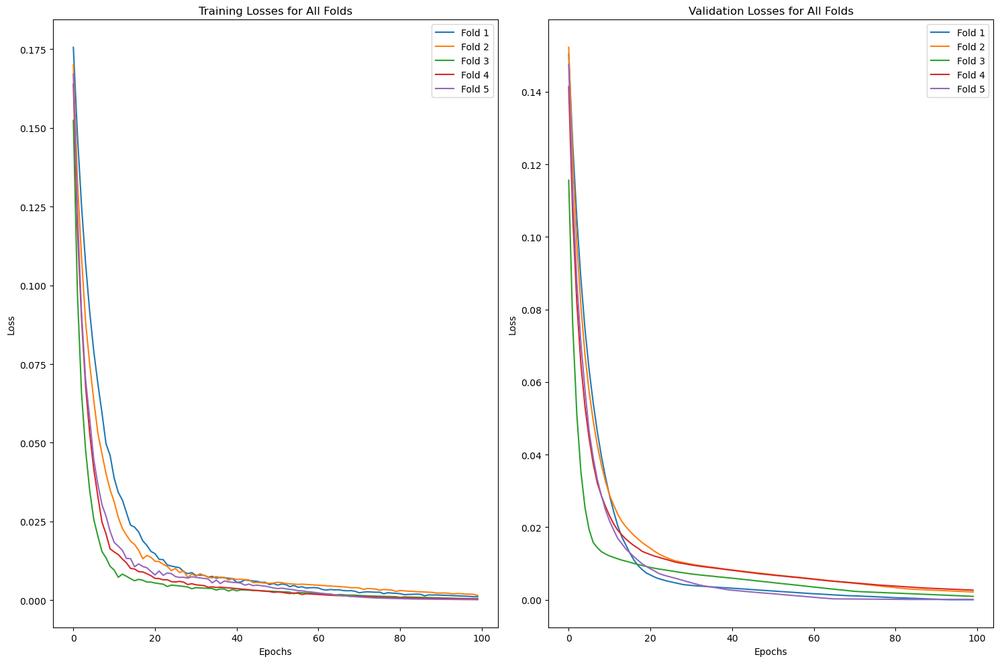

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_81 (Dense)                │ (None, 16)             │        32,016 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,628 (127.46 KB)

 Trainable params: 32,626 (127.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [33]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(16, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(32, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(16, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(32, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [34]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 9.6652e-04


0.0015925852349027991

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.790


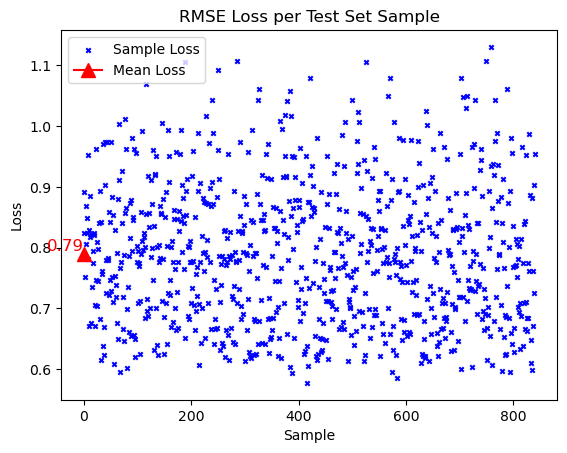

In [35]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:16, 2:64}, 2)


Epoch 1: val_loss improved from inf to 0.13173, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.13173 to 0.09753, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.09753 to 0.07366, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.07366 to 0.05722, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.05722 to 0.04465, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.04465 to 0.03471, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.03471 to 0.02747, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.02747 to 0.02210, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.02210 to 0.01808, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.01808 to 0.01479, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.01479 to 0.01205, saving model to bes

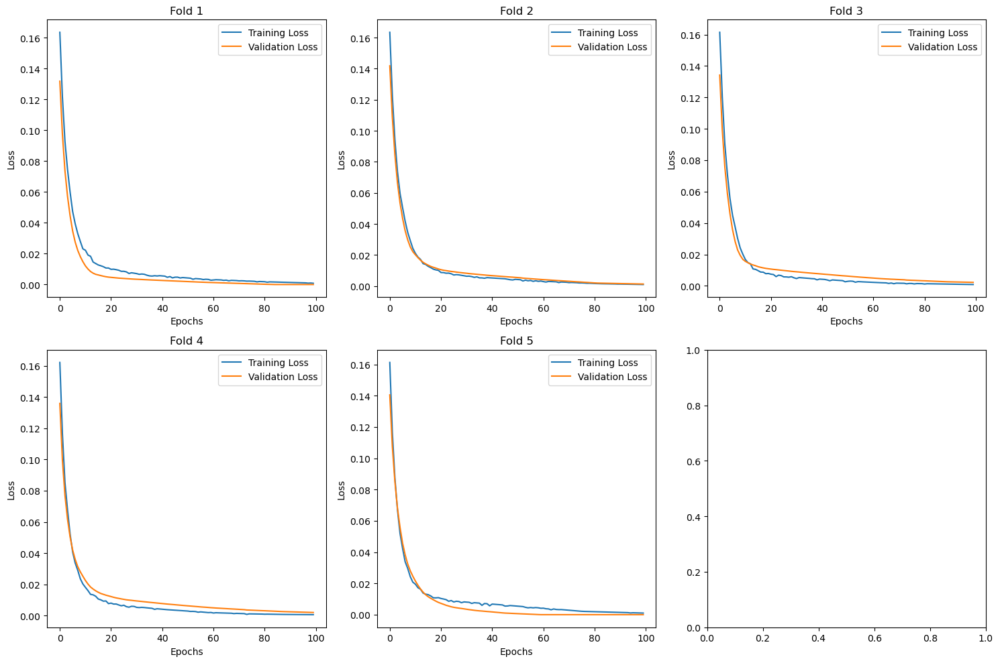

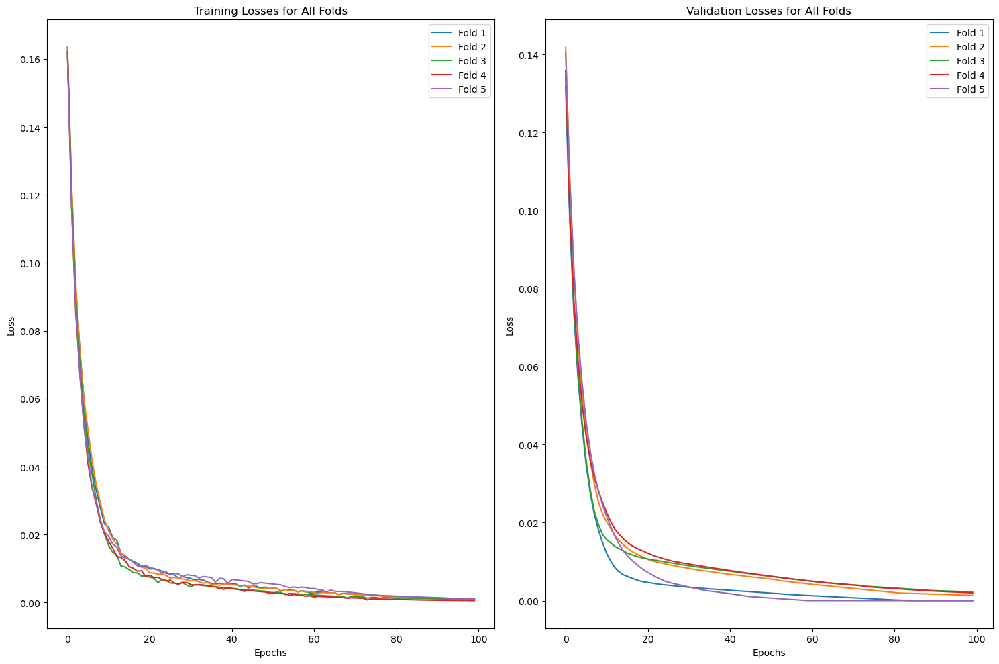

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_99 (Dense)                │ (None, 16)             │        32,016 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 64)             │         1,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,236 (129.83 KB)

 Trainable params: 33,234 (129.82 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [36]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(16, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(64, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(16, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(64, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [37]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 7.6657e-04


0.0013552618911489844

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step
Overall Mean Loss: 0.813


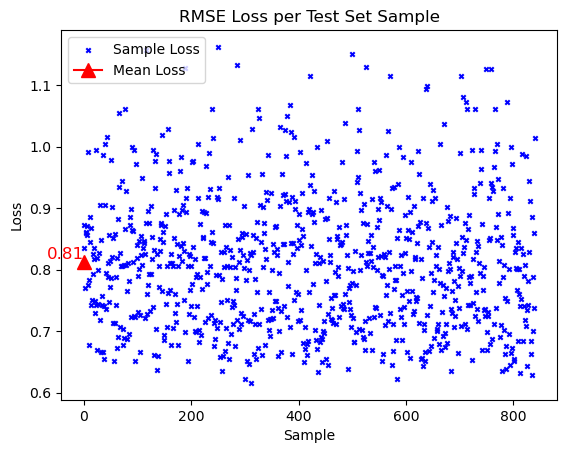

In [38]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:32, 2:8}, 2)


Epoch 1: val_loss improved from inf to 0.12472, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.12472 to 0.08390, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.08390 to 0.05799, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.05799 to 0.04030, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.04030 to 0.02833, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.02833 to 0.02052, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.02052 to 0.01563, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.01563 to 0.01186, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.01186 to 0.00938, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.00938 to 0.00755, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00755 to 0.00645, saving model to bes

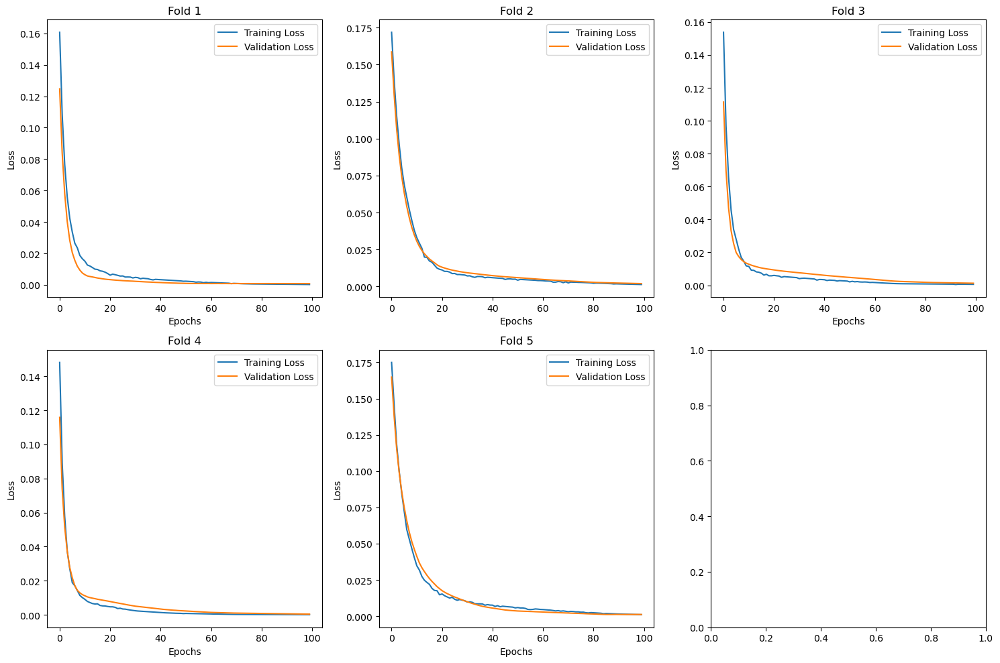

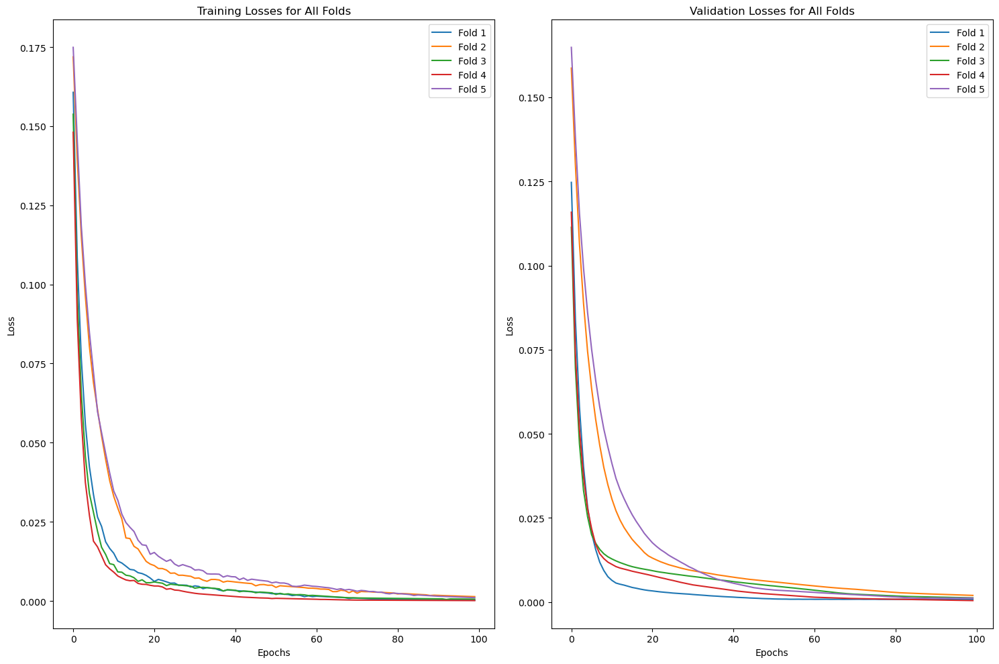

Best model index: 4, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_1.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_117 (Dense)               │ (None, 32)             │        64,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 8)              │           264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_119 (Dense)               │ (None, 2)              │            18 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 64,316 (251.24 KB)

 Trainable params: 64,314 (251.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [39]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(32, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(8, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(32, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(8, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [40]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 3.7986e-04


0.000660968478769064

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Overall Mean Loss: 0.876


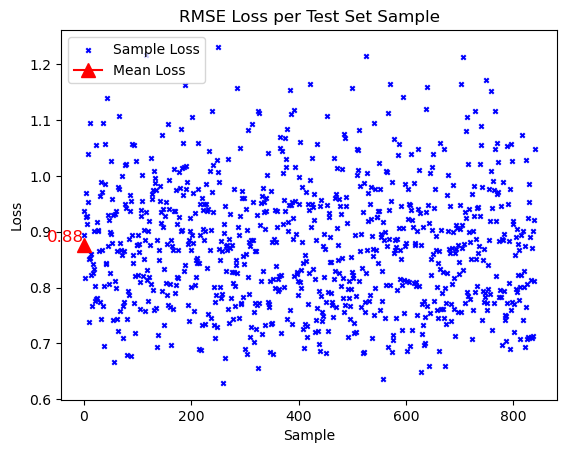

In [41]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:32, 2:16}, 2)


Epoch 1: val_loss improved from inf to 0.12206, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.12206 to 0.08612, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.08612 to 0.06372, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.06372 to 0.04818, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.04818 to 0.03676, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.03676 to 0.02755, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.02755 to 0.02078, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.02078 to 0.01587, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.01587 to 0.01205, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.01205 to 0.00971, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00971 to 0.00784, saving model to bes

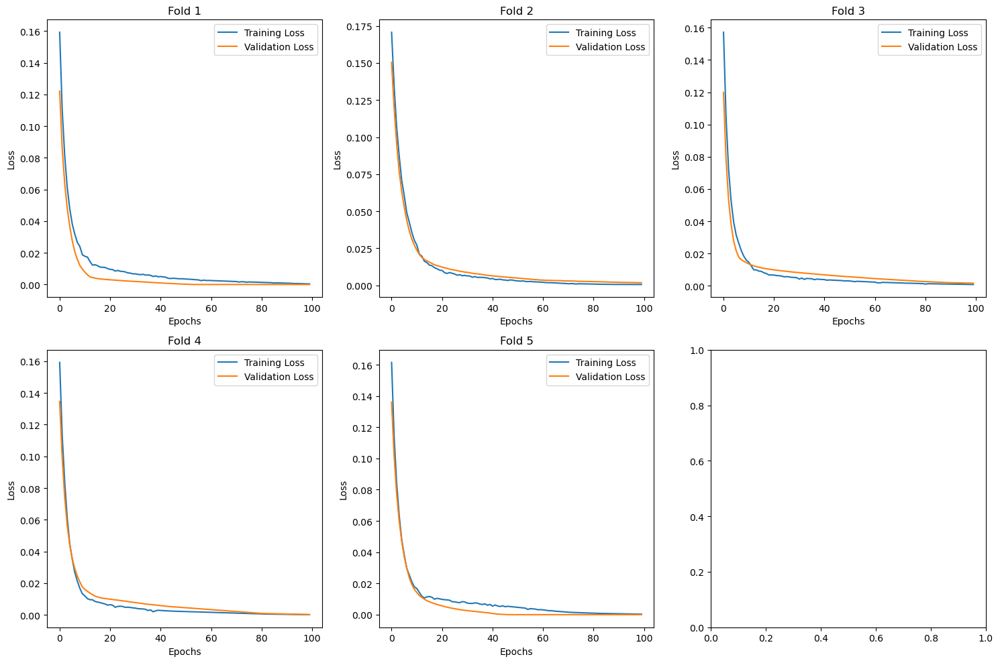

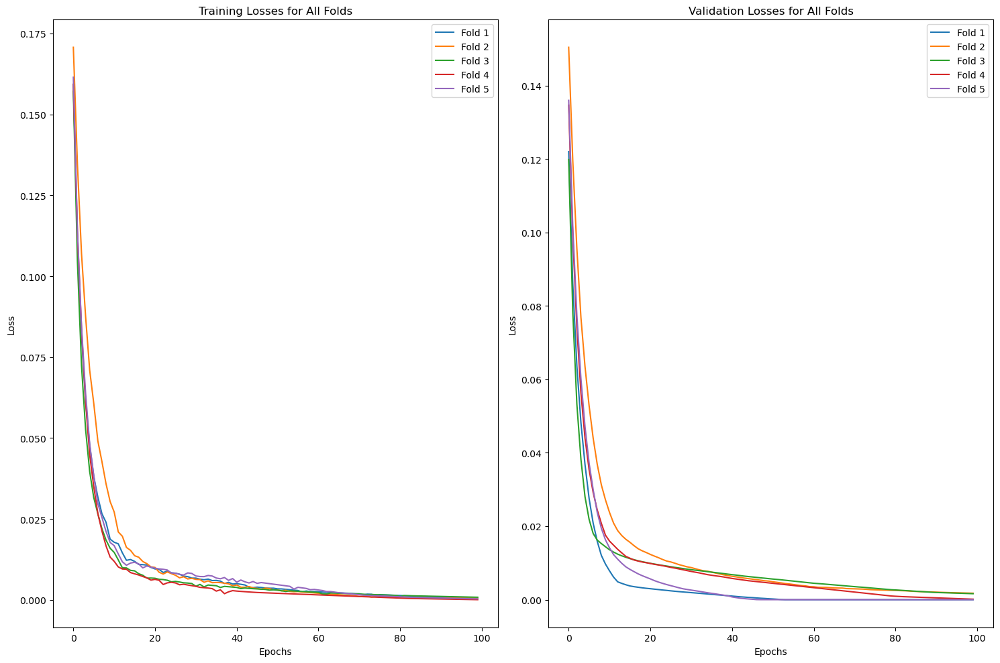

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_135 (Dense)               │ (None, 32)             │        64,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 2)              │            34 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 64,596 (252.33 KB)

 Trainable params: 64,594 (252.32 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [42]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(32, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(16, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(32, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(16, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [43]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 9.8819e-04


0.001719471998512745

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.779


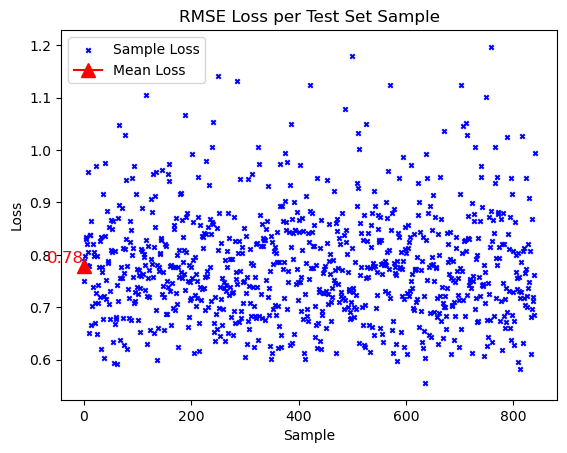

In [44]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:32, 2:64}, 2)


Epoch 1: val_loss improved from inf to 0.13926, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.13926 to 0.10624, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.10624 to 0.08269, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.08269 to 0.06561, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.06561 to 0.05286, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.05286 to 0.04291, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.04291 to 0.03509, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.03509 to 0.02853, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.02853 to 0.02291, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.02291 to 0.01842, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.01842 to 0.01528, saving model to bes

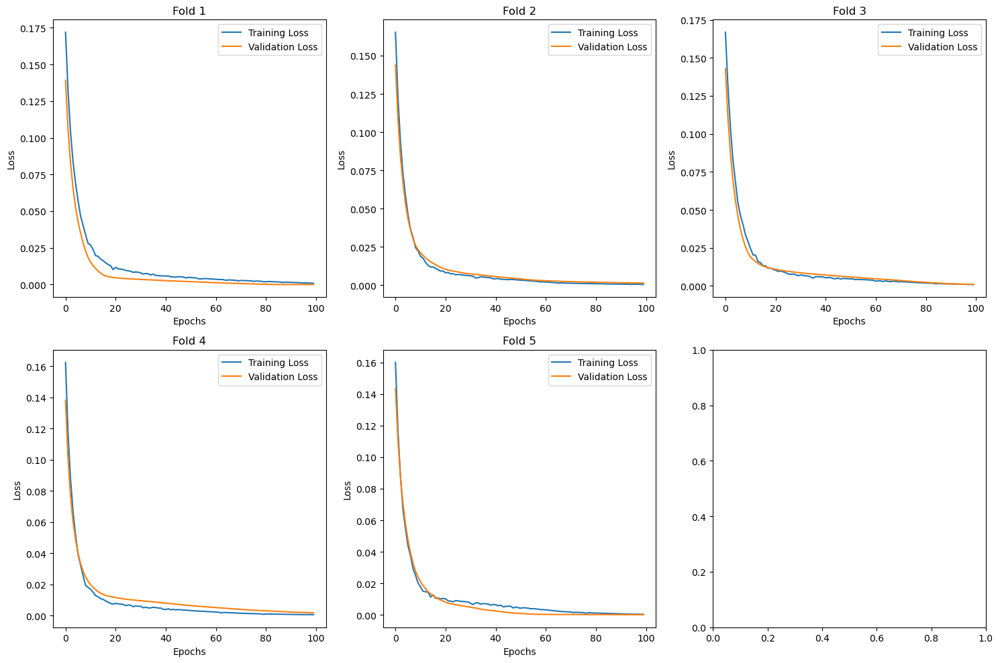

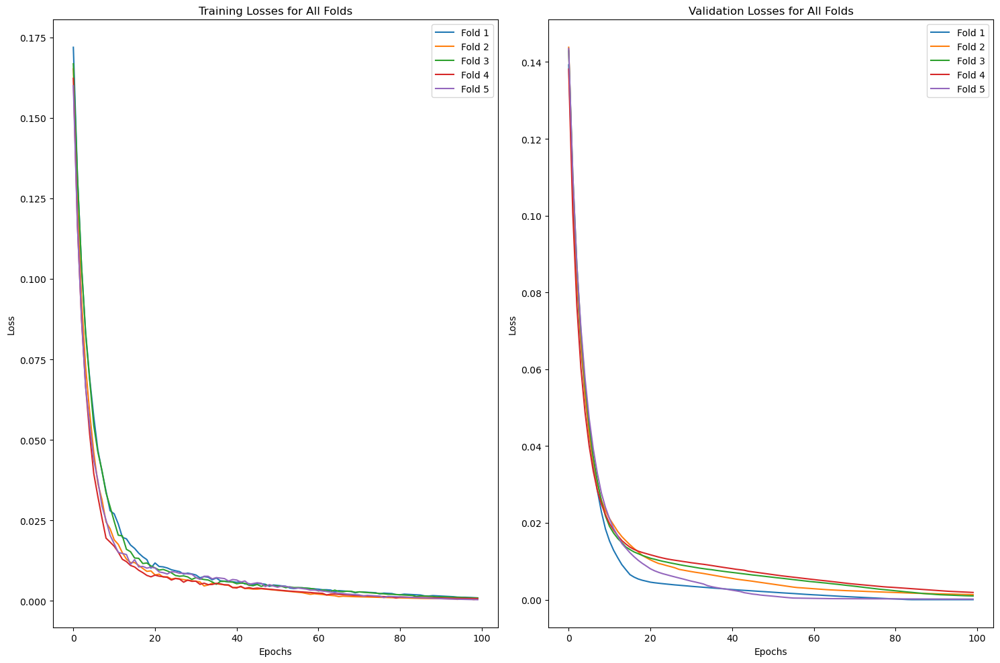

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_153 (Dense)               │ (None, 32)             │        64,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_154 (Dense)               │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 66,276 (258.89 KB)

 Trainable params: 66,274 (258.88 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [45]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(32, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(64, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(32, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(64, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [46]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 0.0013   


0.0018185499357059598

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.793


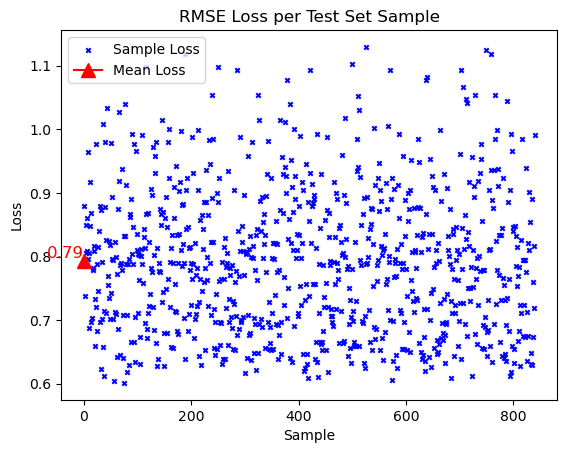

In [47]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:64, 2:8}, 2)


Epoch 1: val_loss improved from inf to 0.10903, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.10903 to 0.06631, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.06631 to 0.04251, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.04251 to 0.02735, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.02735 to 0.01822, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.01822 to 0.01250, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.01250 to 0.00913, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.00913 to 0.00705, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.00705 to 0.00578, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.00578 to 0.00481, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00481 to 0.00404, saving model to bes

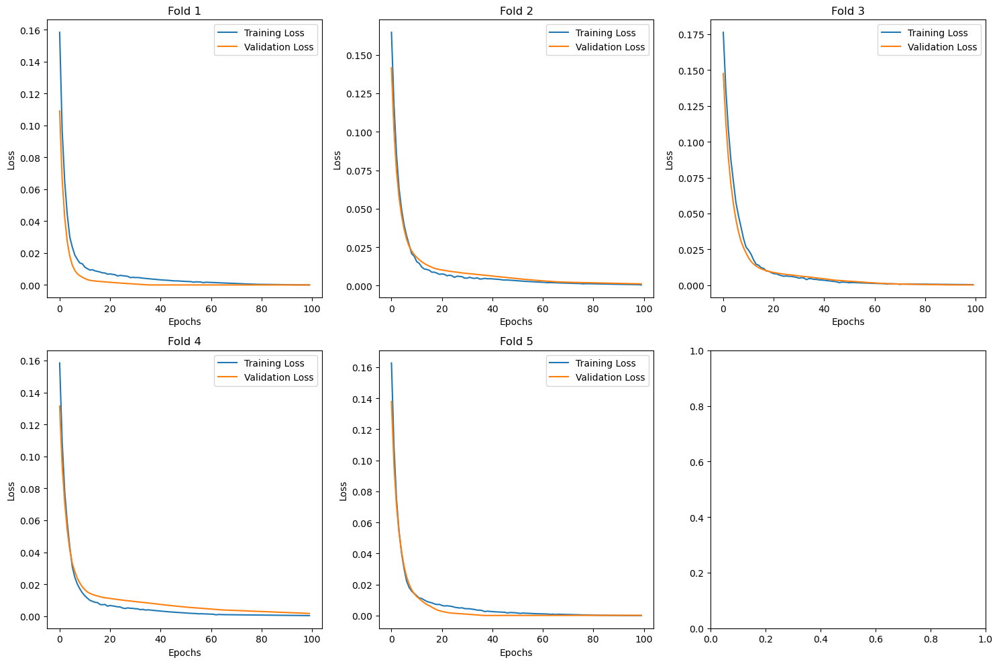

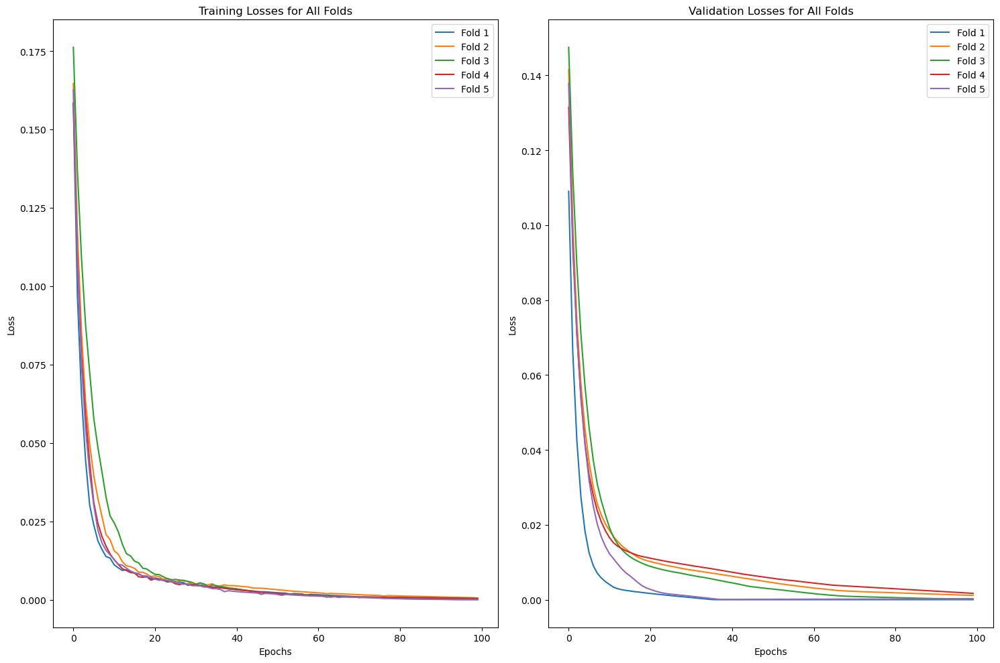

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_171 (Dense)               │ (None, 64)             │       128,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 8)              │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 2)              │            18 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 128,604 (502.36 KB)

 Trainable params: 128,602 (502.35 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [48]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(8, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(8, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [49]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 0.0016   


0.0018756083445623517

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.789


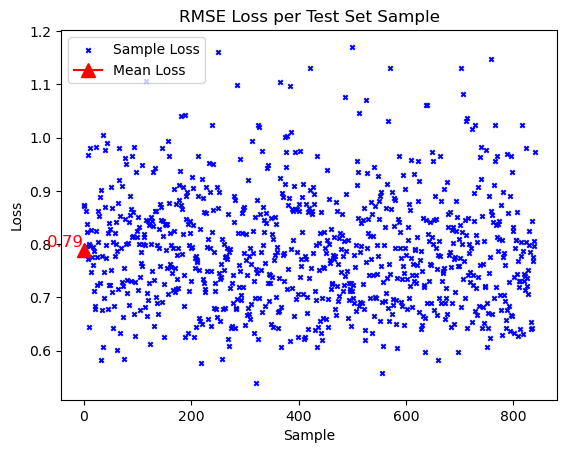

In [50]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:64, 2:16}, 2)


Epoch 1: val_loss improved from inf to 0.12818, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.12818 to 0.08307, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.08307 to 0.05628, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.05628 to 0.03873, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.03873 to 0.02758, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.02758 to 0.01967, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.01967 to 0.01453, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.01453 to 0.01022, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.01022 to 0.00727, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.00727 to 0.00544, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00544 to 0.00431, saving model to bes

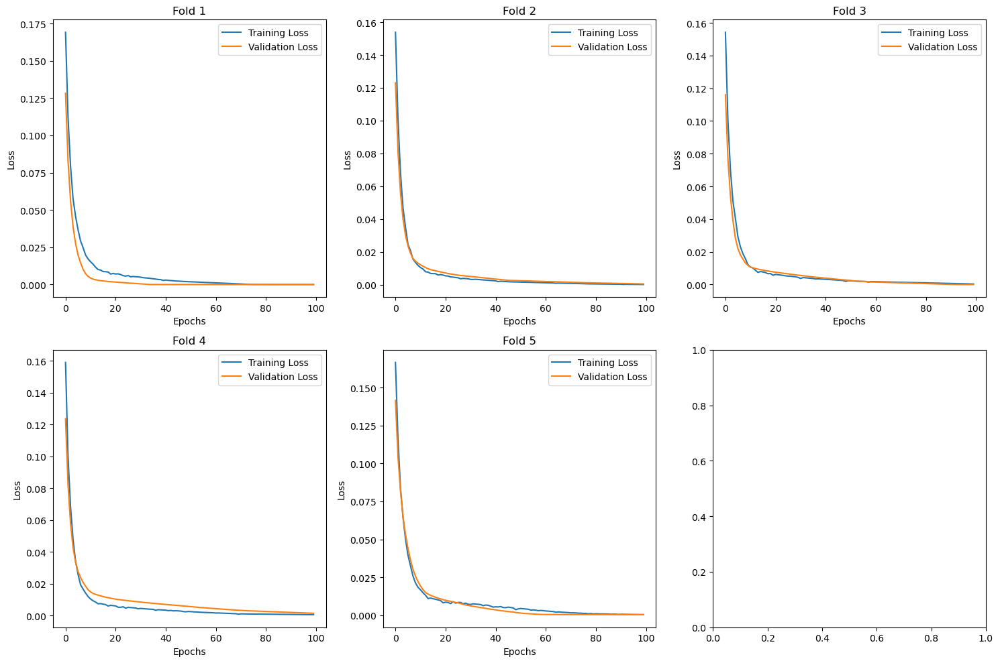

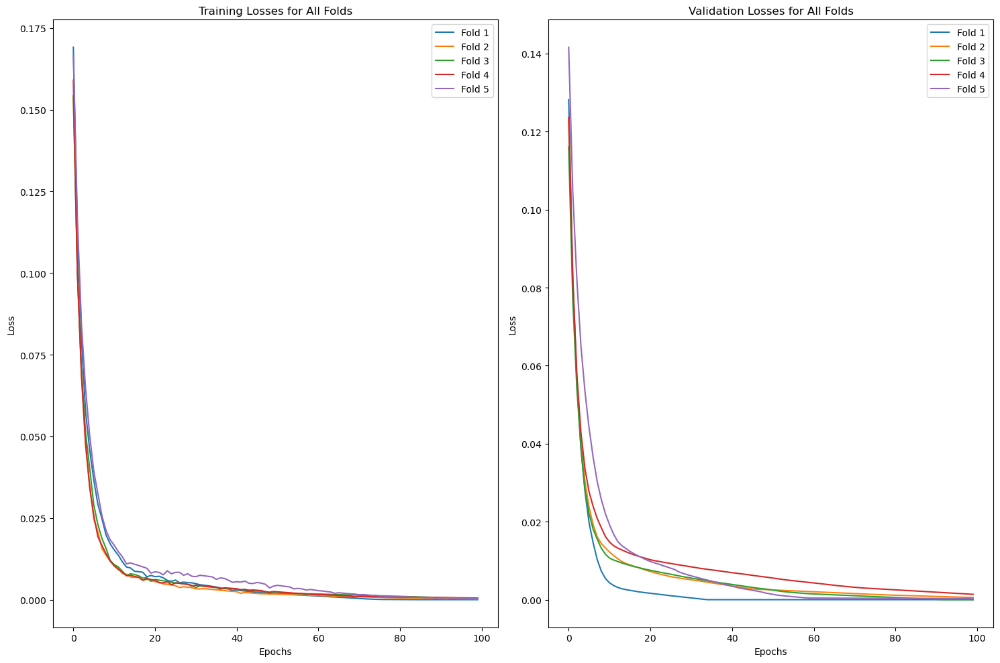

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │       128,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 16)             │         1,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 2)              │            34 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 129,140 (504.46 KB)

 Trainable params: 129,138 (504.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [51]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(16, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(16, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [52]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0016     


0.0019484522053971887

 1/27 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.762


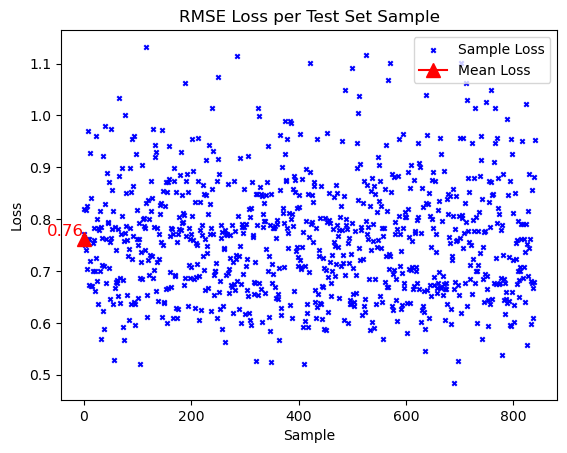

In [53]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:64, 2:32}, 2)


Epoch 1: val_loss improved from inf to 0.13569, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.13569 to 0.10157, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.10157 to 0.07720, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.07720 to 0.05983, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.05983 to 0.04699, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.04699 to 0.03665, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.03665 to 0.02930, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.02930 to 0.02408, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.02408 to 0.01992, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.01992 to 0.01661, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.01661 to 0.01365, saving model to bes

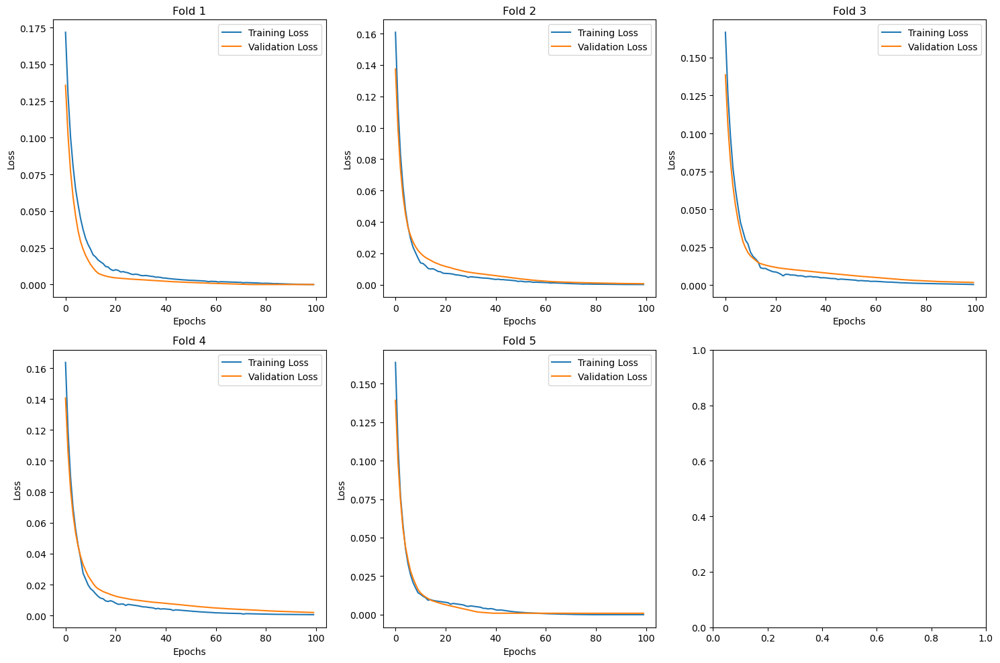

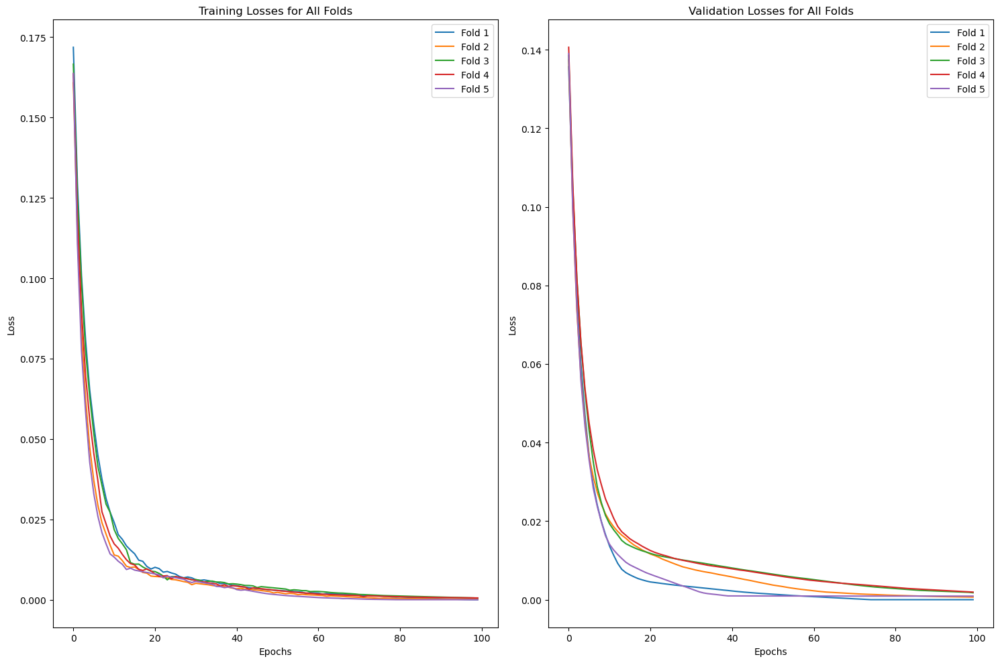

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_207 (Dense)               │ (None, 64)             │       128,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 130,212 (508.64 KB)

 Trainable params: 130,210 (508.63 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [54]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(32, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(32, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [55]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 0.0014   


0.0019139996729791164

 1/27 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Overall Mean Loss: 0.821


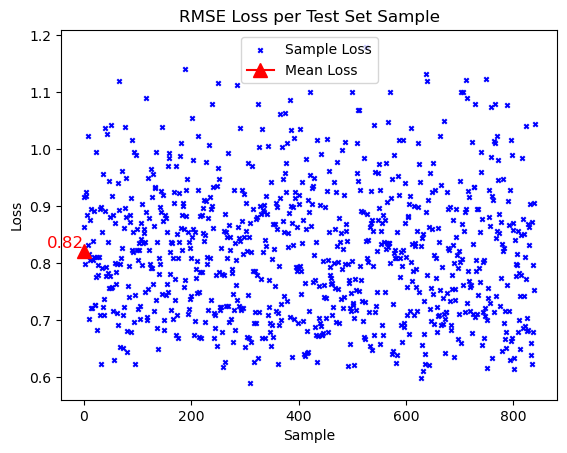

In [56]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:128, 2:8}, 2)


Epoch 1: val_loss improved from inf to 0.12149, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.12149 to 0.07880, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.07880 to 0.05387, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.05387 to 0.03785, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.03785 to 0.02719, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.02719 to 0.01947, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.01947 to 0.01484, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.01484 to 0.01121, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.01121 to 0.00888, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.00888 to 0.00755, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00755 to 0.00661, saving model to bes

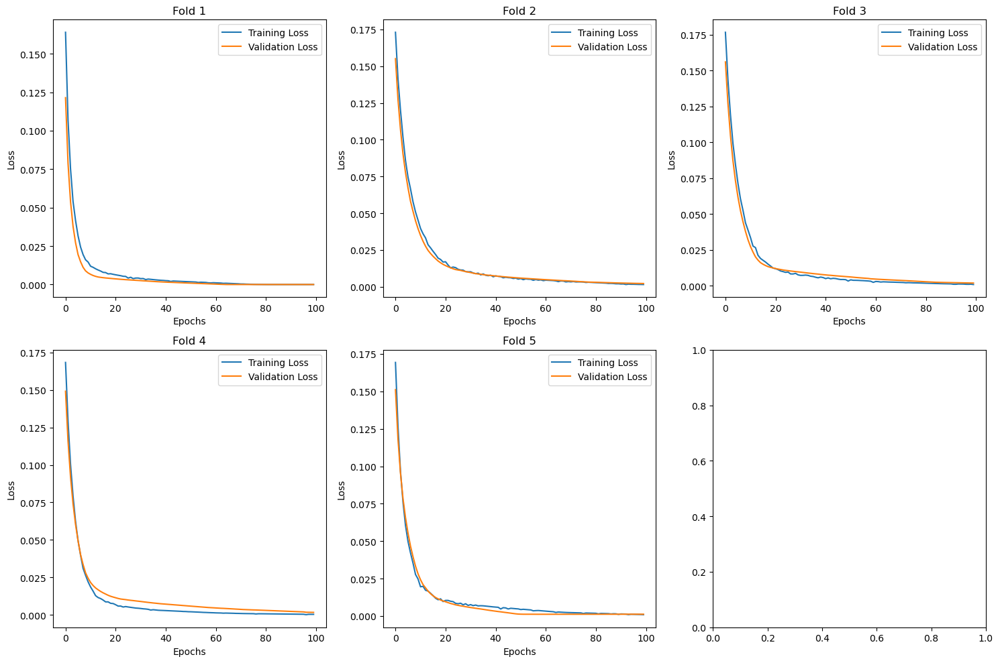

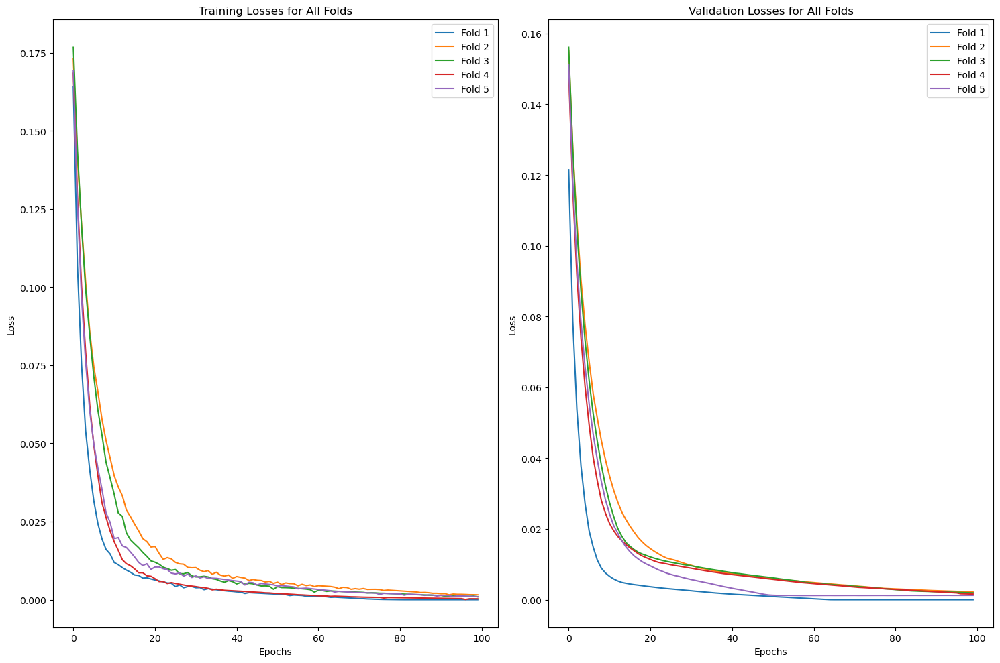

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_225 (Dense)               │ (None, 128)            │       256,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 8)              │         1,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 2)              │            18 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 257,180 (1004.61 KB)

 Trainable params: 257,178 (1004.60 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [57]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(128, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(8, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(128, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(8, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [58]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0012     


0.0012699947692453861

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


Overall Mean Loss: 0.847


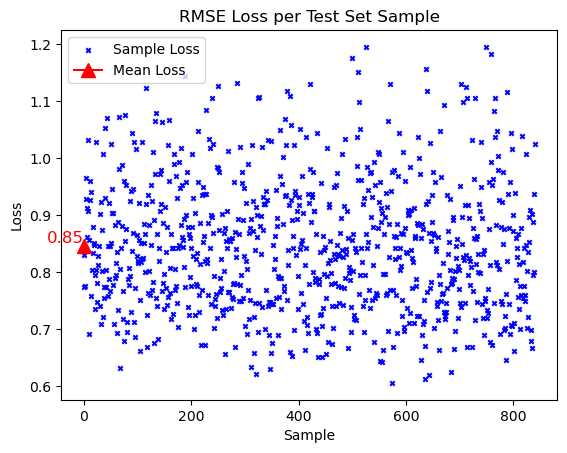

In [59]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:128, 2:16}, 2)


Epoch 1: val_loss improved from inf to 0.11620, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.11620 to 0.07719, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.07719 to 0.05288, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.05288 to 0.03783, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.03783 to 0.02761, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.02761 to 0.02011, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.02011 to 0.01486, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.01486 to 0.01148, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.01148 to 0.00888, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.00888 to 0.00710, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00710 to 0.00579, saving model to bes

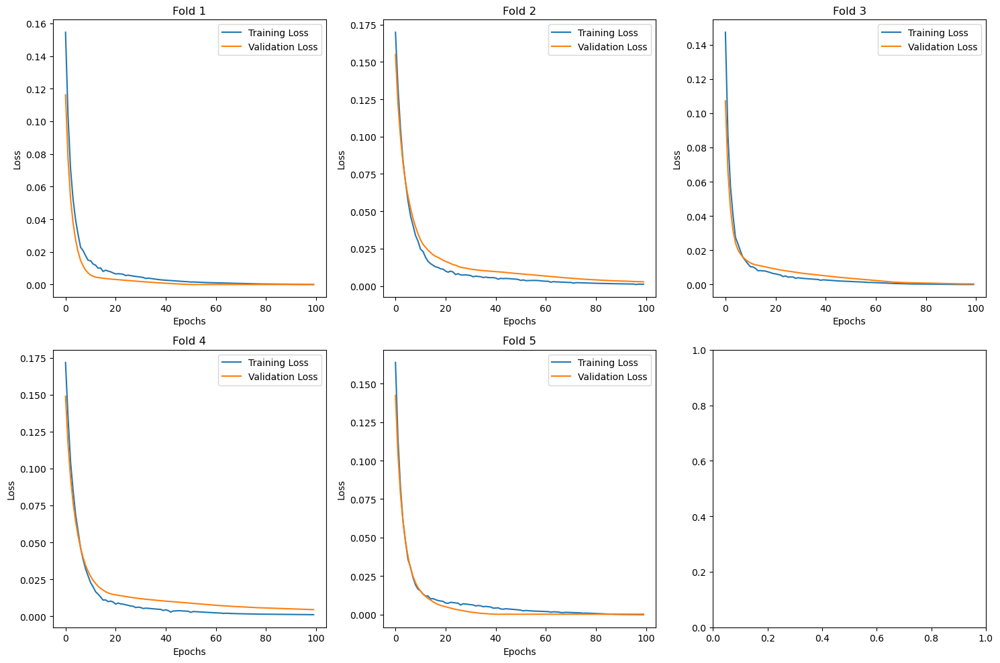

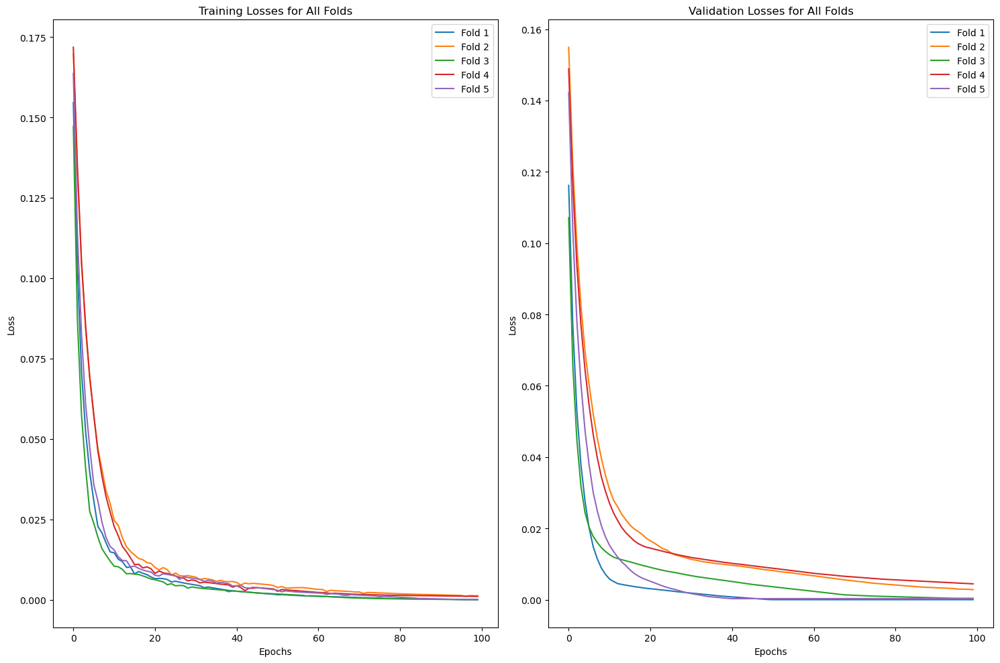

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_243 (Dense)               │ (None, 128)            │       256,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 16)             │         2,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_245 (Dense)               │ (None, 2)              │            34 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 258,228 (1008.71 KB)

 Trainable params: 258,226 (1008.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [60]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(128, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(16, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(128, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(16, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [61]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 9.0166e-04


0.0017157288966700435

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.790


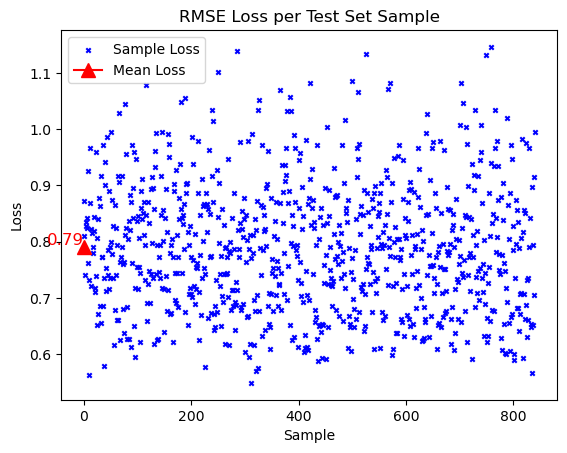

In [62]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:128, 2:32}, 2)


Epoch 1: val_loss improved from inf to 0.10912, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.10912 to 0.06774, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.06774 to 0.04395, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.04395 to 0.02947, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.02947 to 0.02051, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.02051 to 0.01445, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.01445 to 0.01082, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.01082 to 0.00810, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.00810 to 0.00667, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.00667 to 0.00570, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00570 to 0.00502, saving model to bes

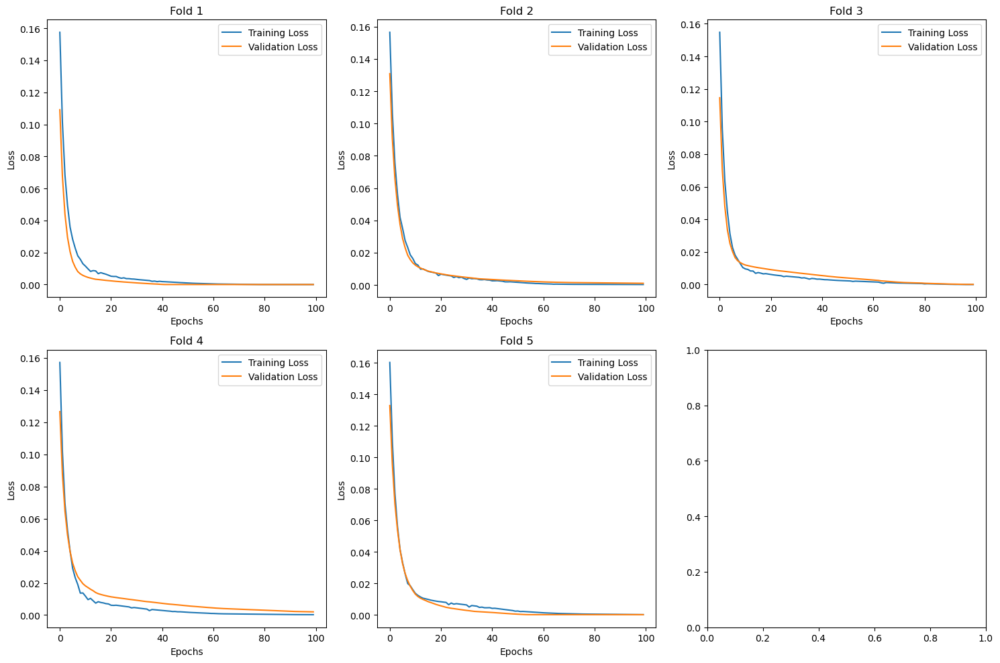

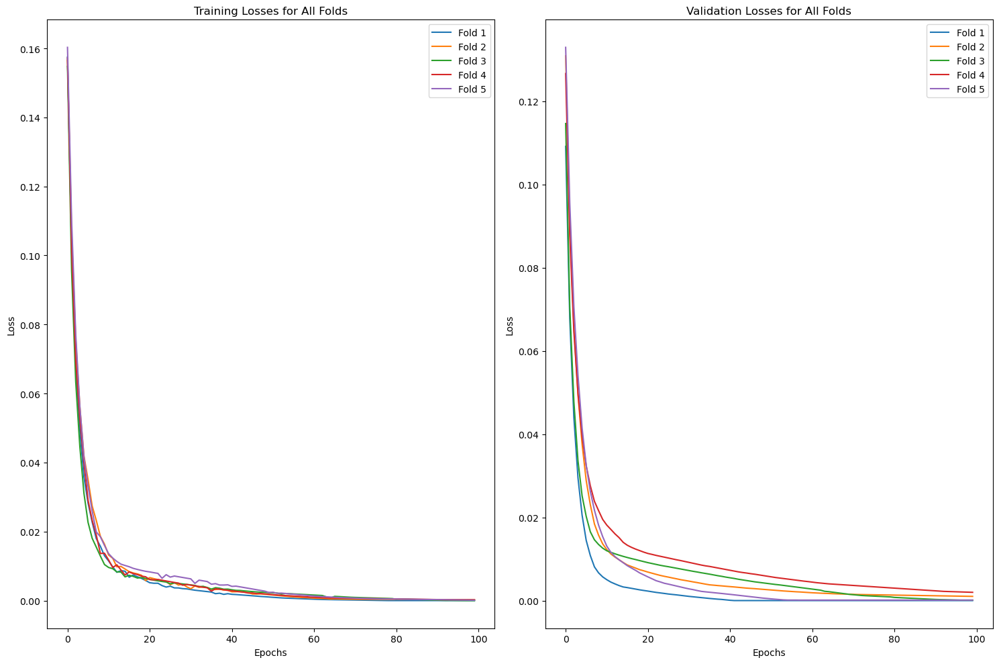

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_261 (Dense)               │ (None, 128)            │       256,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 260,324 (1016.89 KB)

 Trainable params: 260,322 (1016.88 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [63]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(128, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(32, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(128, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(32, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [64]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 7.4994e-04


0.0013169923331588507

 1/27 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.812


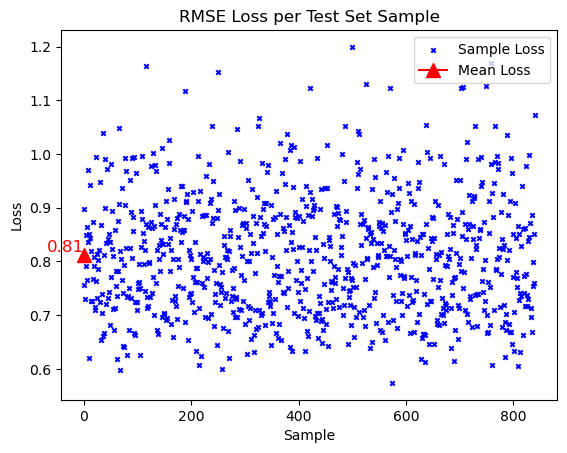

In [65]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:128, 2:64}, 2)


Epoch 1: val_loss improved from inf to 0.11486, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.11486 to 0.07415, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.07415 to 0.05076, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.05076 to 0.03613, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.03613 to 0.02587, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.02587 to 0.01889, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.01889 to 0.01389, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.01389 to 0.01084, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.01084 to 0.00822, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.00822 to 0.00633, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00633 to 0.00496, saving model to bes

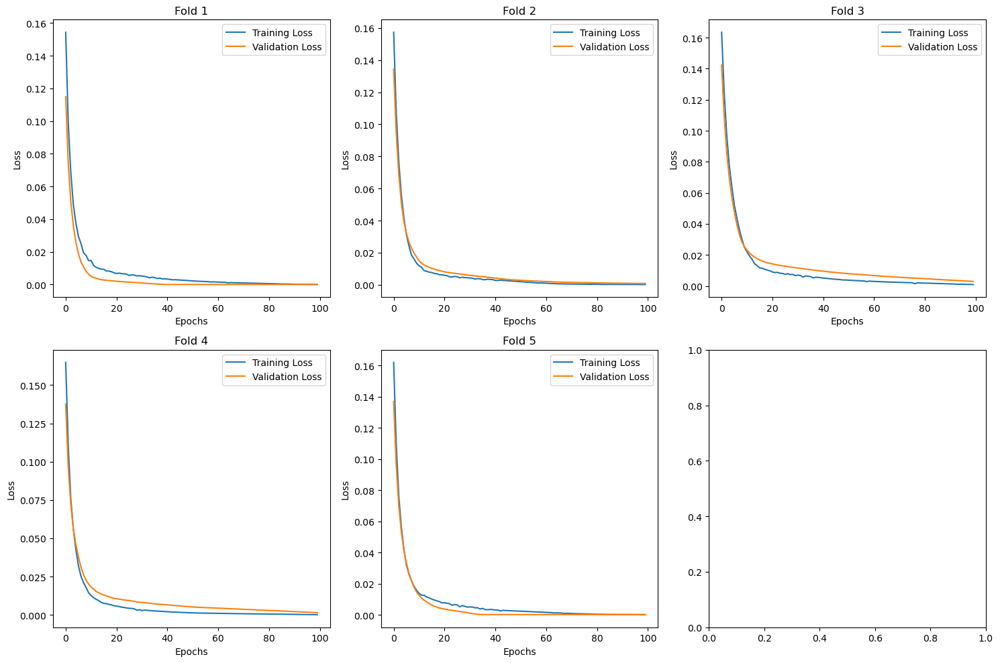

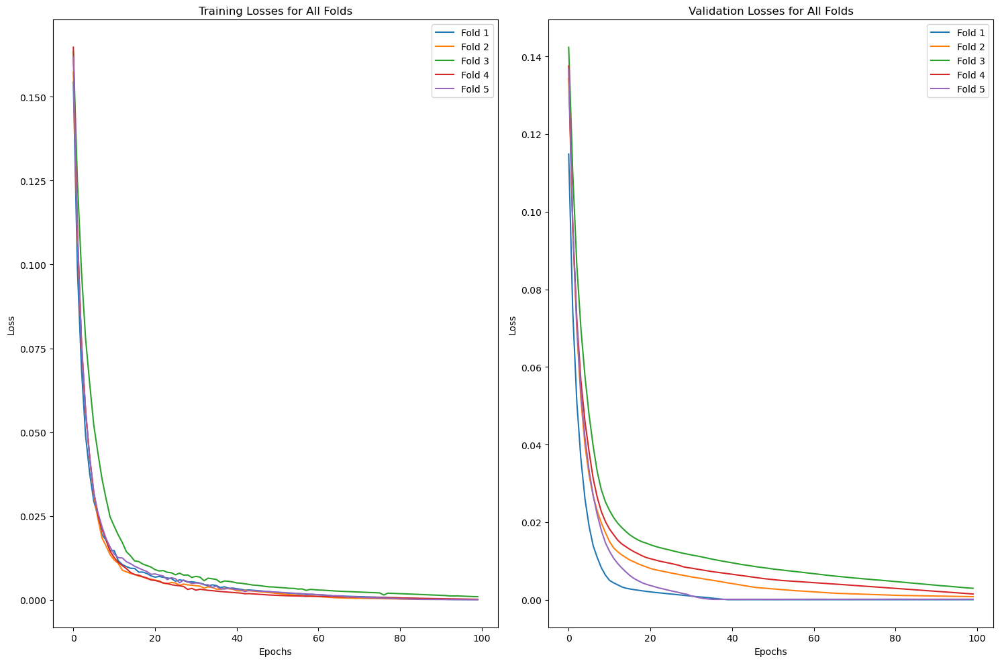

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_279 (Dense)               │ (None, 128)            │       256,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_280 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 264,516 (1.01 MB)

 Trainable params: 264,514 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [66]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(128, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(64, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(128, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(64, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [67]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - loss: 0.0010   


0.0017568033654242754

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.774


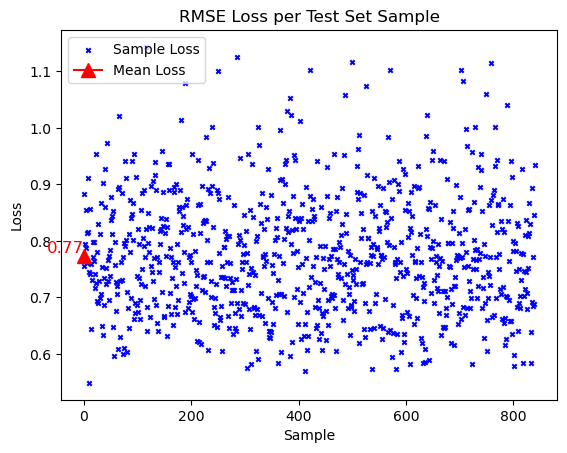

In [68]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:16, 2:8, 3:4}, 2)


Epoch 1: val_loss improved from inf to 0.10789, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.10789 to 0.06929, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.06929 to 0.04882, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.04882 to 0.03587, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.03587 to 0.02731, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.02731 to 0.02168, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.02168 to 0.01771, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.01771 to 0.01510, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.01510 to 0.01311, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.01311 to 0.01136, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.01136 to 0.00977, saving model to bes

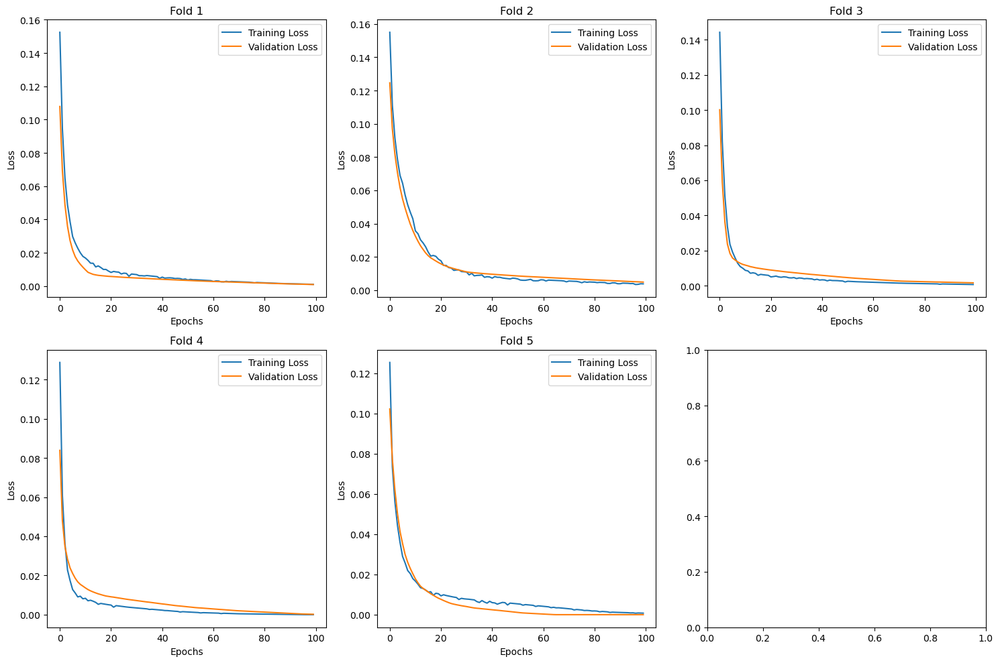

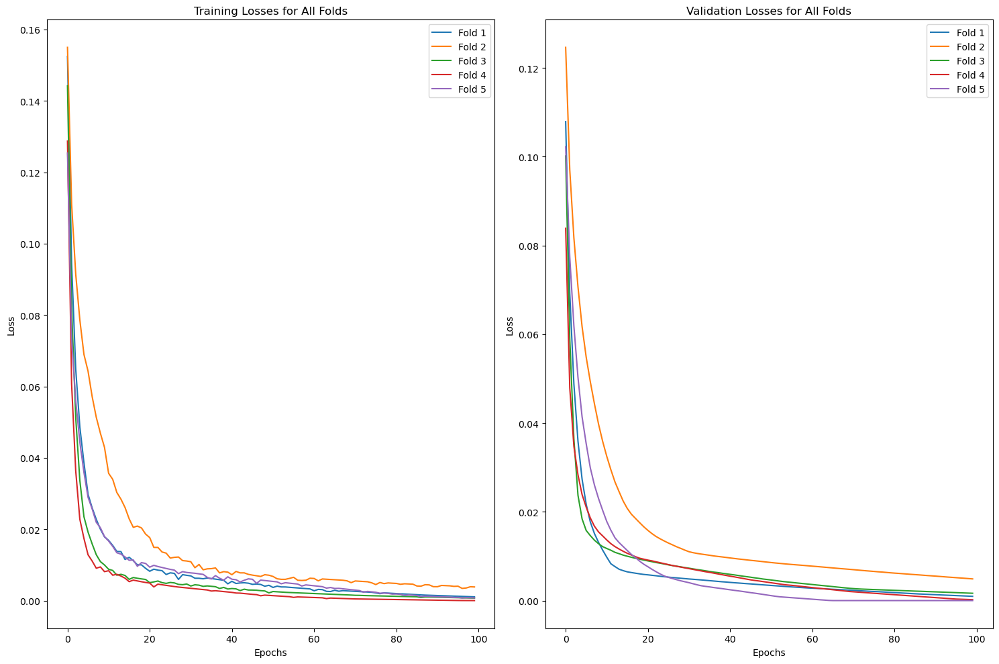

Best model index: 5, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_1.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_302 (Dense)               │ (None, 16)             │        32,016 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 4)              │            36 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 2)              │            10 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,200 (125.79 KB)

 Trainable params: 32,198 (125.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [69]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(16, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(8, activation='tanh'))
    model.add(Dense(4, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(16, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(8, activation='tanh'))
best_model.add(Dense(4, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [70]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 9.5279e-04


0.0016578719951212406

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 1.115


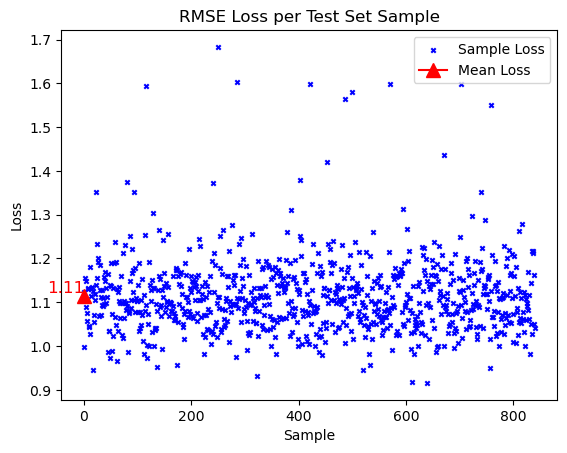

In [71]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:32, 2:16, 3:8}, 2)


Epoch 1: val_loss improved from inf to 0.05990, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.05990 to 0.02156, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.02156 to 0.00953, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.00953 to 0.00586, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.00586 to 0.00471, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.00471 to 0.00419, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.00419 to 0.00377, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.00377 to 0.00342, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.00342 to 0.00301, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.00301 to 0.00267, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00267 to 0.00238, saving model to bes

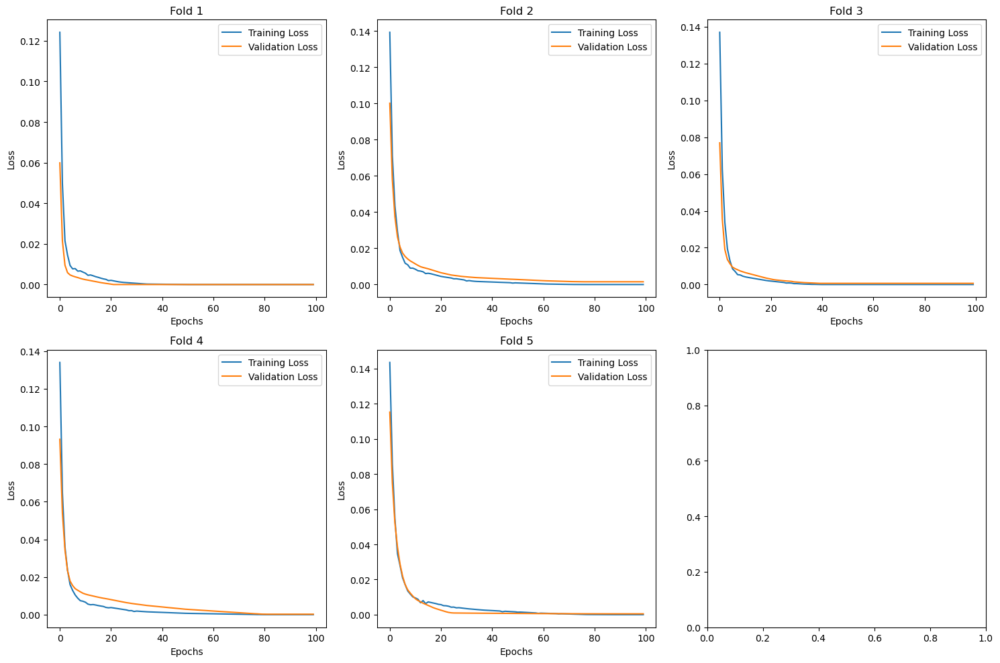

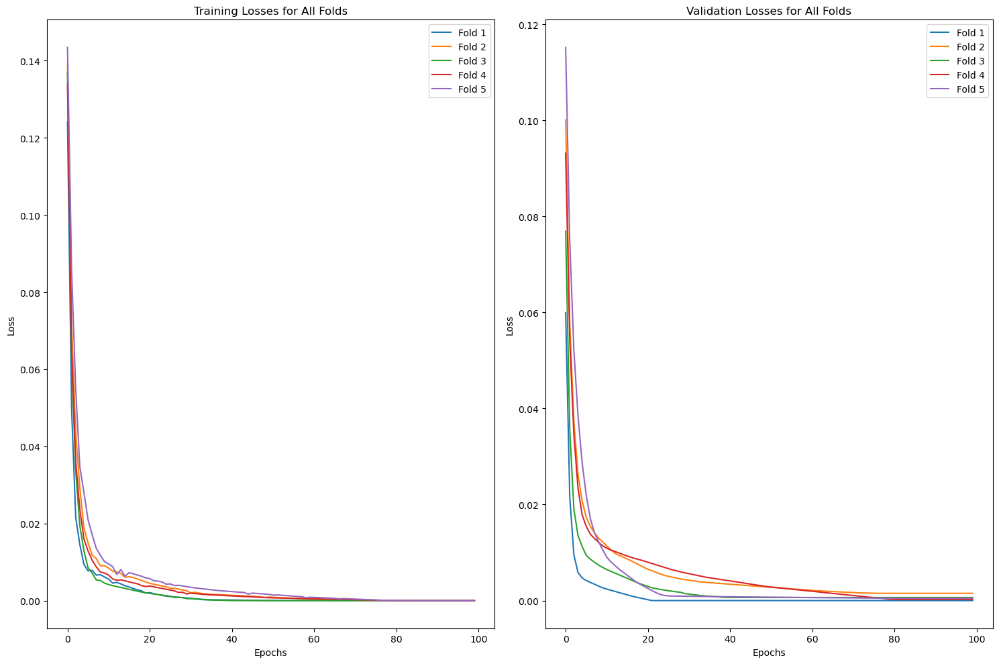

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_113"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_326 (Dense)               │ (None, 32)             │        64,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_329 (Dense)               │ (None, 2)              │            18 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 64,716 (252.80 KB)

 Trainable params: 64,714 (252.79 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [72]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(32, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(16, activation='tanh'))
    model.add(Dense(8, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(32, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(16, activation='tanh'))
best_model.add(Dense(8, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [73]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 4.3998e-04


0.000765567587222904

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.867


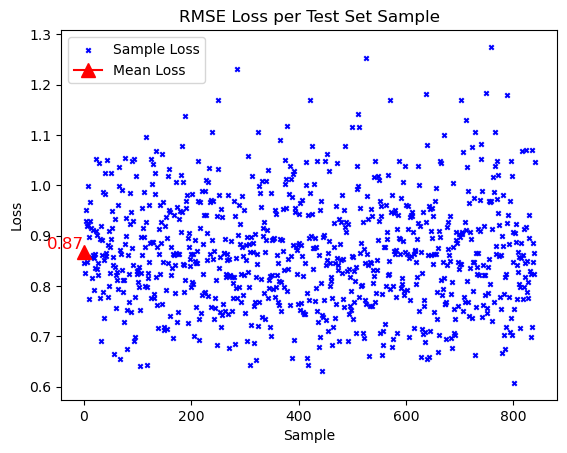

In [74]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:64, 2:32, 3:8}, 2)


Epoch 1: val_loss improved from inf to 0.12598, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.12598 to 0.08860, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.08860 to 0.06414, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.06414 to 0.04812, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.04812 to 0.03686, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.03686 to 0.02865, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.02865 to 0.02322, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.02322 to 0.01930, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.01930 to 0.01594, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.01594 to 0.01352, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.01352 to 0.01112, saving model to bes

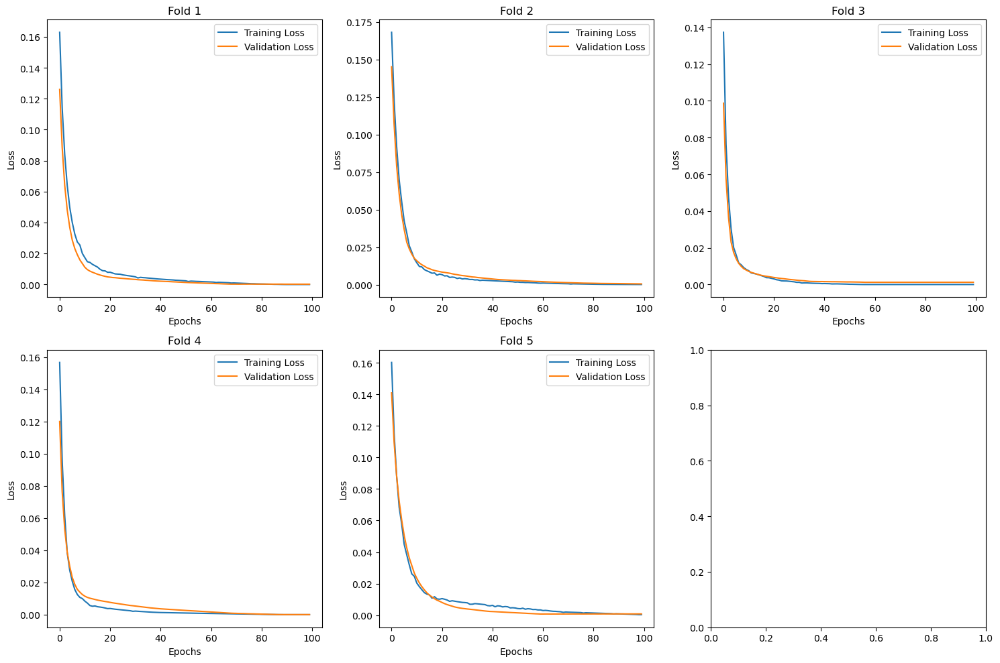

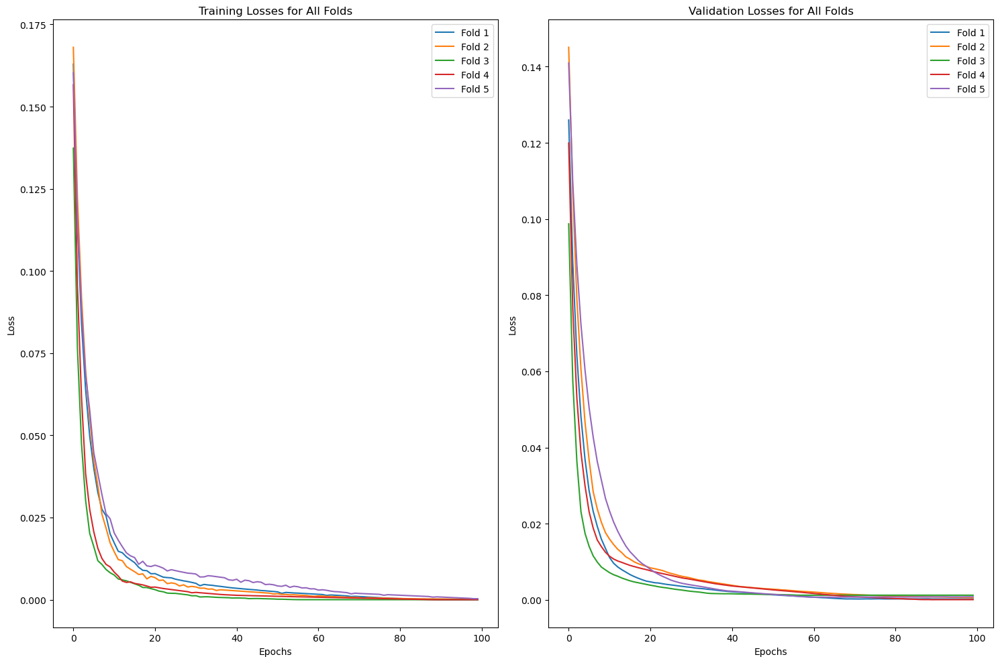

Best model index: 4, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_1.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras


Model: "sequential_119"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │       128,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 8)              │           264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 2)              │            18 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 130,428 (509.49 KB)

 Trainable params: 130,426 (509.48 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [75]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(32, activation='tanh'))
    model.add(Dense(8, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(32, activation='tanh'))
best_model.add(Dense(8, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [76]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 0.0013   


0.002102939411997795

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Overall Mean Loss: 0.844


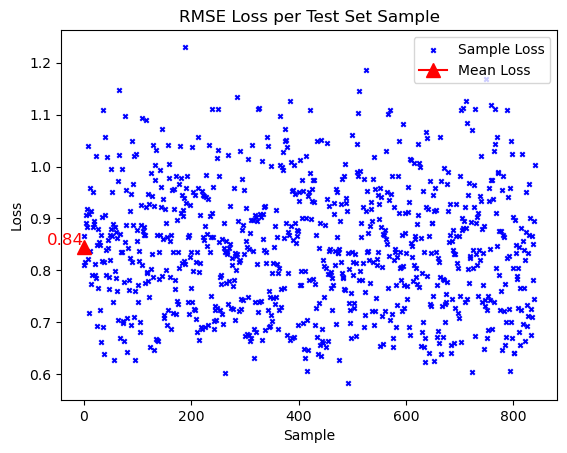

In [77]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:64, 2:16, 3:4}, 2)


Epoch 1: val_loss improved from inf to 0.08796, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.08796 to 0.04908, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.04908 to 0.02991, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.02991 to 0.01979, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.01979 to 0.01454, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.01454 to 0.01123, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.01123 to 0.00846, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.00846 to 0.00670, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.00670 to 0.00576, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.00576 to 0.00489, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00489 to 0.00460, saving model to bes

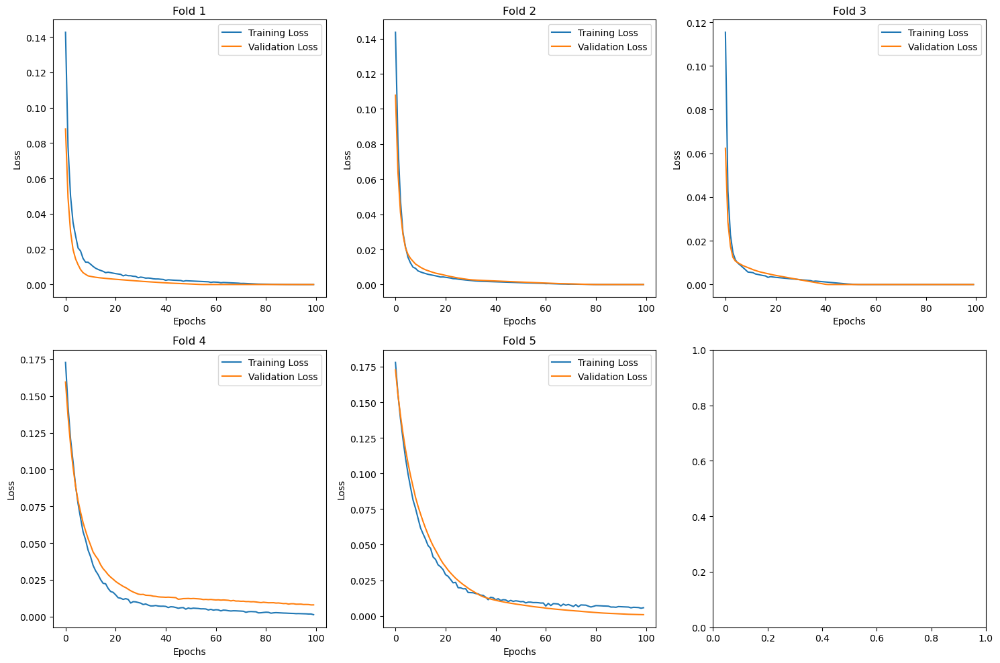

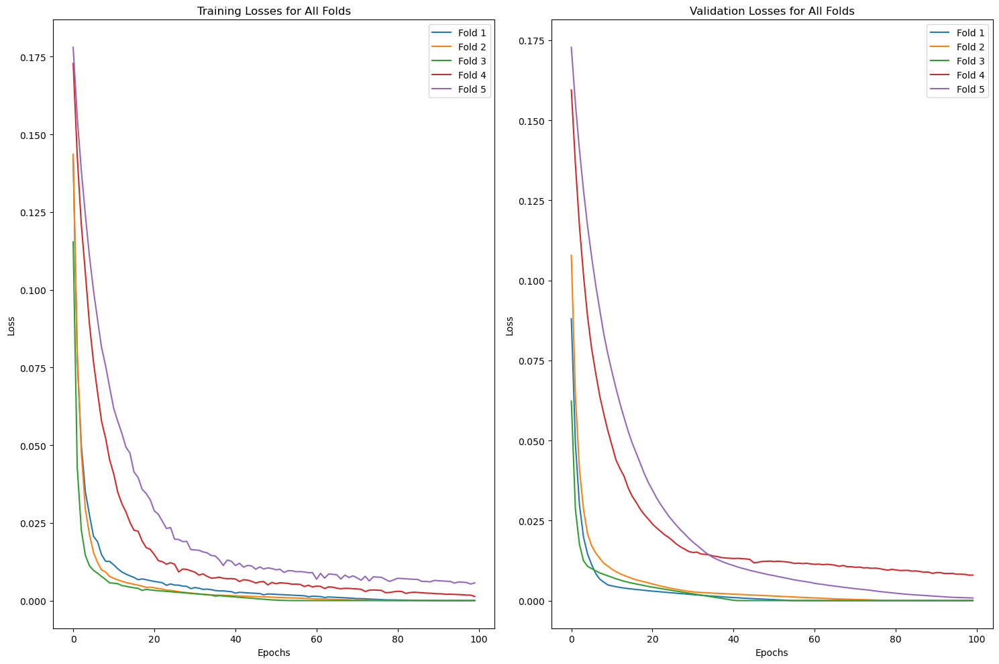

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_125"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_374 (Dense)               │ (None, 64)             │       128,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 16)             │         1,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 4)              │            68 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 2)              │            10 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 129,184 (504.63 KB)

 Trainable params: 129,182 (504.62 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [78]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(16, activation='tanh'))
    model.add(Dense(4, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(16, activation='tanh'))
best_model.add(Dense(4, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [79]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 5.5641e-04


0.0009681655210442841

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Overall Mean Loss: 0.862


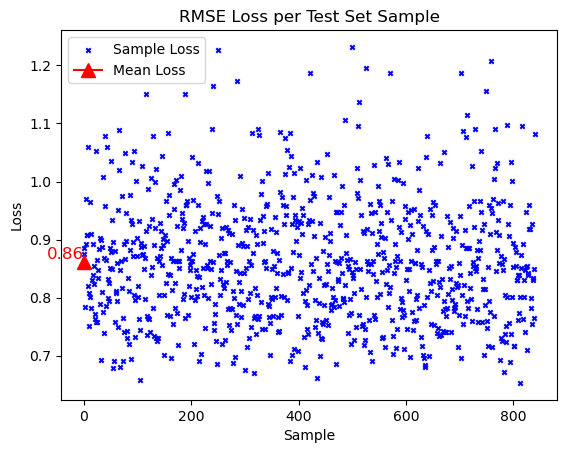

In [80]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:64, 2:16, 3:8}, 2)


Epoch 1: val_loss improved from inf to 0.07832, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.07832 to 0.03878, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.03878 to 0.02248, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.02248 to 0.01396, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.01396 to 0.00962, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.00962 to 0.00757, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.00757 to 0.00669, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.00669 to 0.00601, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.00601 to 0.00559, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.00559 to 0.00535, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00535 to 0.00514, saving model to bes

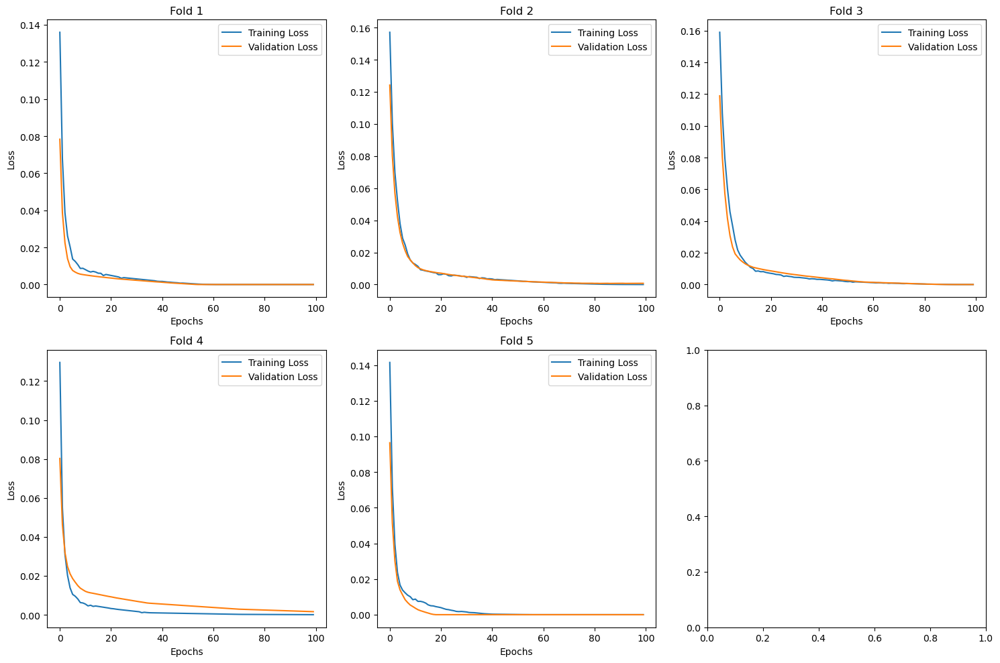

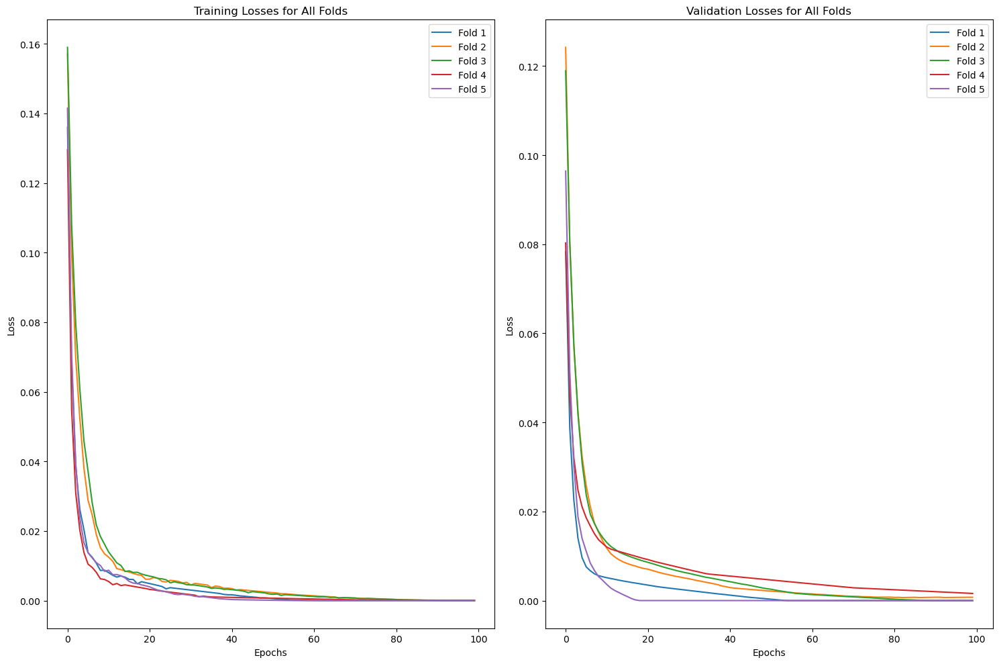

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_131"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_398 (Dense)               │ (None, 64)             │       128,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_399 (Dense)               │ (None, 16)             │         1,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 2)              │            18 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 129,260 (504.93 KB)

 Trainable params: 129,258 (504.91 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [81]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(16, activation='tanh'))
    model.add(Dense(8, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(16, activation='tanh'))
best_model.add(Dense(8, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [82]:
best_model.evaluate(X_test_vect, scaled_labels_test)

 1/27 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0000e+00

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 3.6920e-04 


0.0006424182211048901

 1/27 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.925


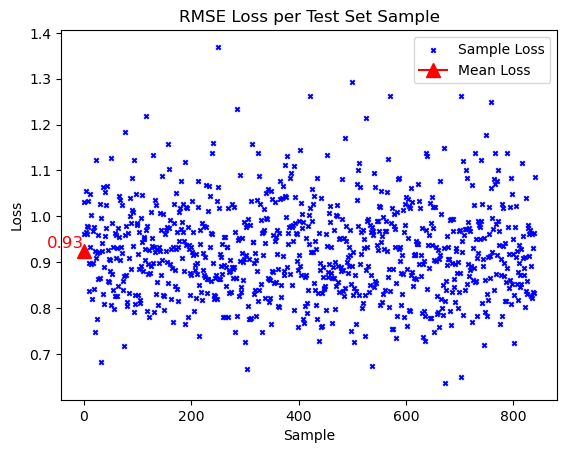

In [83]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:128, 2:64, 3:16}, 2)


Epoch 1: val_loss improved from inf to 0.07230, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.07230 to 0.03232, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.03232 to 0.01696, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.01696 to 0.00968, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.00968 to 0.00648, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.00648 to 0.00504, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.00504 to 0.00435, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.00435 to 0.00381, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.00381 to 0.00330, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.00330 to 0.00287, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00287 to 0.00245, saving model to bes

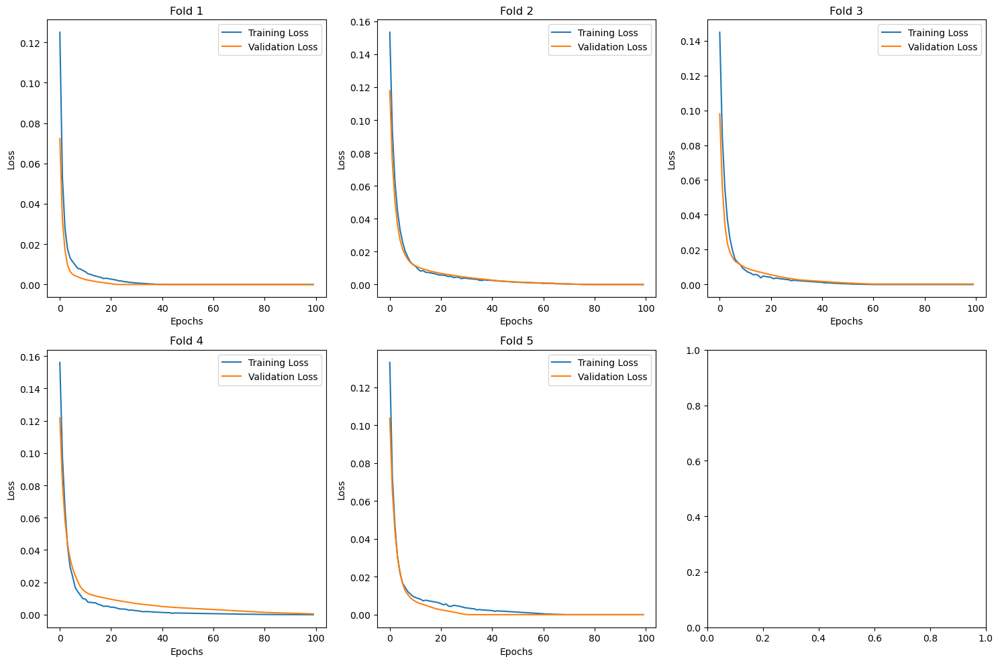

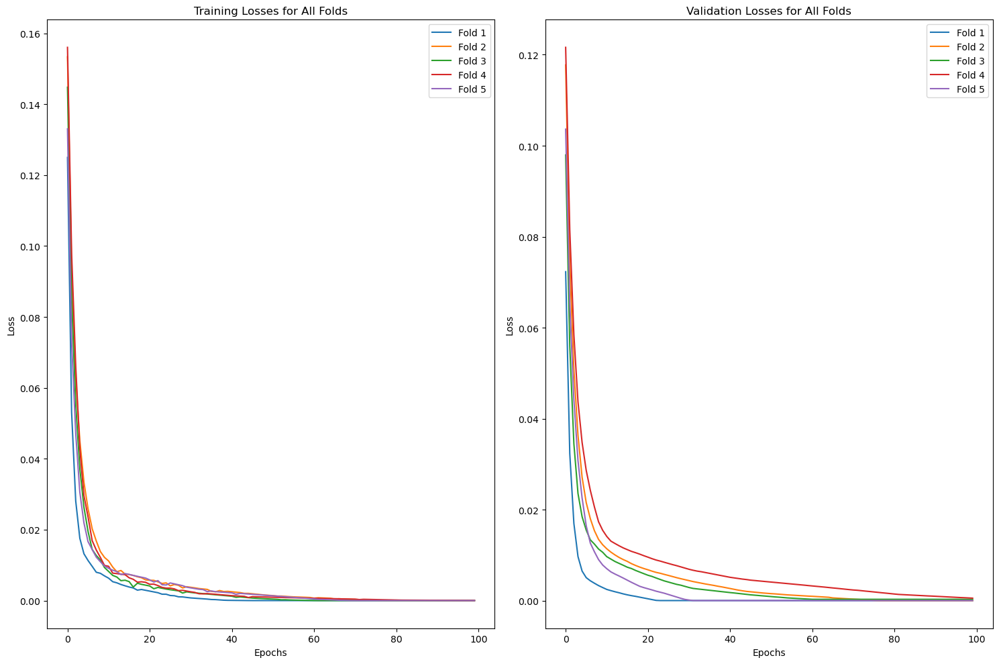

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_137"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_422 (Dense)               │ (None, 128)            │       256,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 16)             │         1,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 2)              │            34 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 265,460 (1.01 MB)

 Trainable params: 265,458 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [84]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(128, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(64, activation='tanh'))
    model.add(Dense(16, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(128, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(64, activation='tanh'))
best_model.add(Dense(16, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [85]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 4.8183e-04


0.000838401319924742

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.859


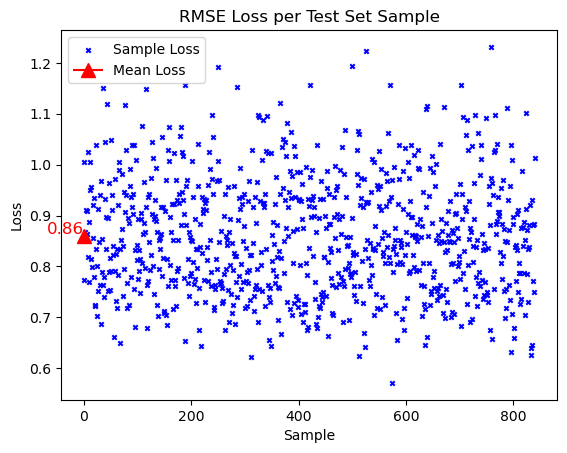

In [86]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:256, 2:128}, 2)


Epoch 1: val_loss improved from inf to 0.12298, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.12298 to 0.08655, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.08655 to 0.06266, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.06266 to 0.04634, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.04634 to 0.03441, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.03441 to 0.02625, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.02625 to 0.02042, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.02042 to 0.01656, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.01656 to 0.01366, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.01366 to 0.01139, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.01139 to 0.00916, saving model to bes

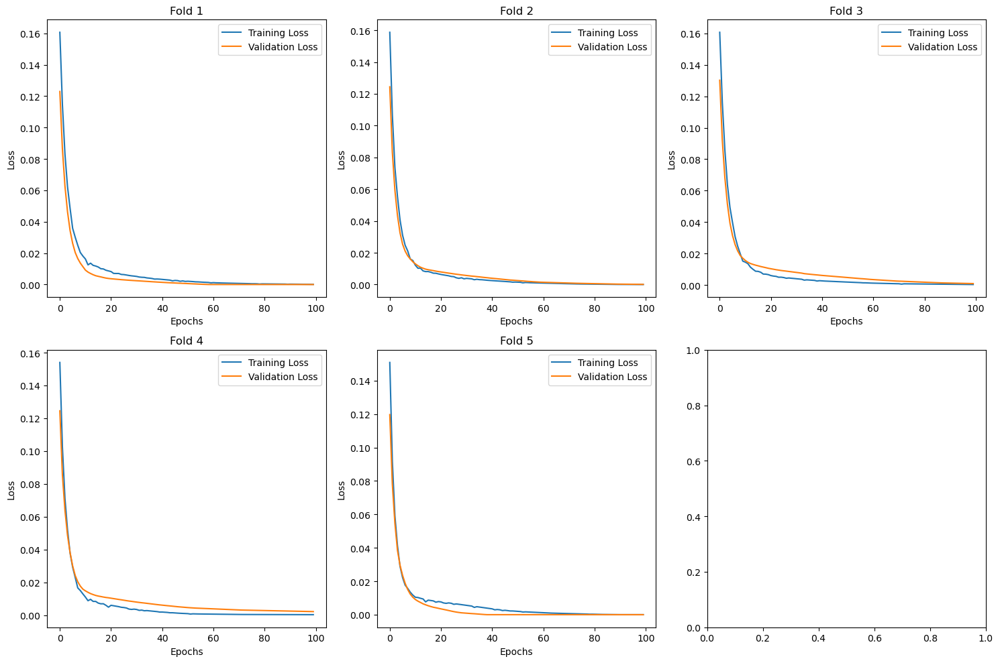

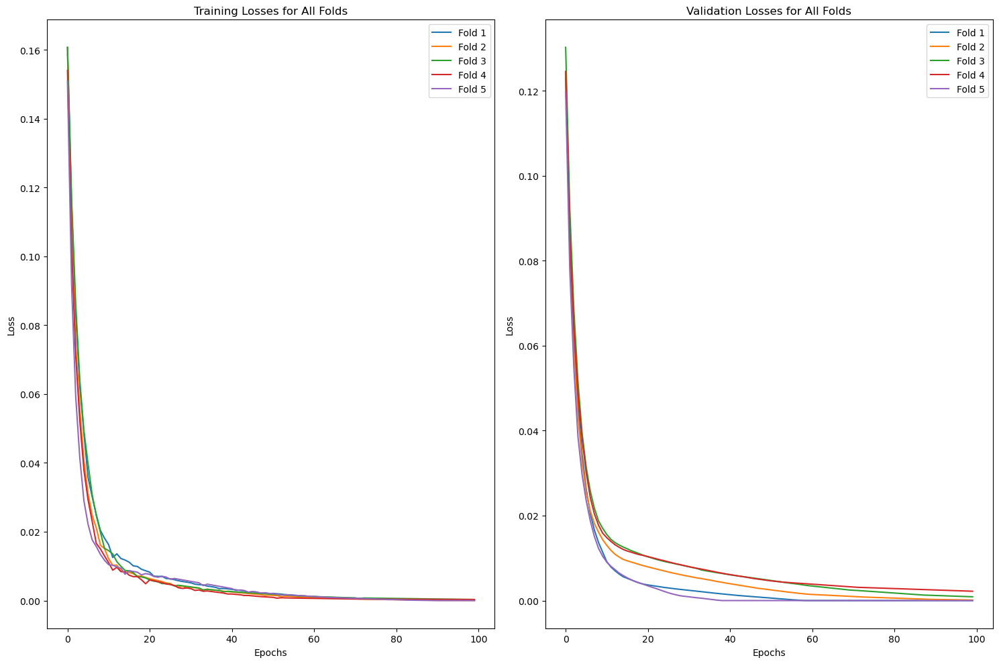

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_143"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 256)            │       512,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 545,412 (2.08 MB)

 Trainable params: 545,410 (2.08 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [87]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(256, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(128, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(256, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(128, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [88]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 603us/step - loss: 9.8417e-04


0.0020062820985913277

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.800


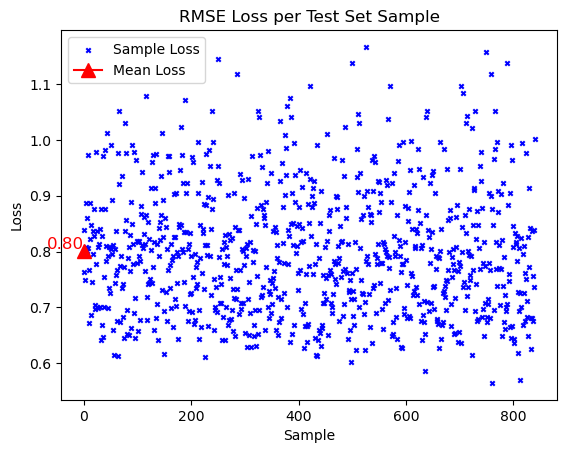

In [89]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:256, 2:64}, 2)


Epoch 1: val_loss improved from inf to 0.11484, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.11484 to 0.07244, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.07244 to 0.04699, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.04699 to 0.03123, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.03123 to 0.02125, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.02125 to 0.01514, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.01514 to 0.01086, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.01086 to 0.00821, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.00821 to 0.00629, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.00629 to 0.00546, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00546 to 0.00505, saving model to bes

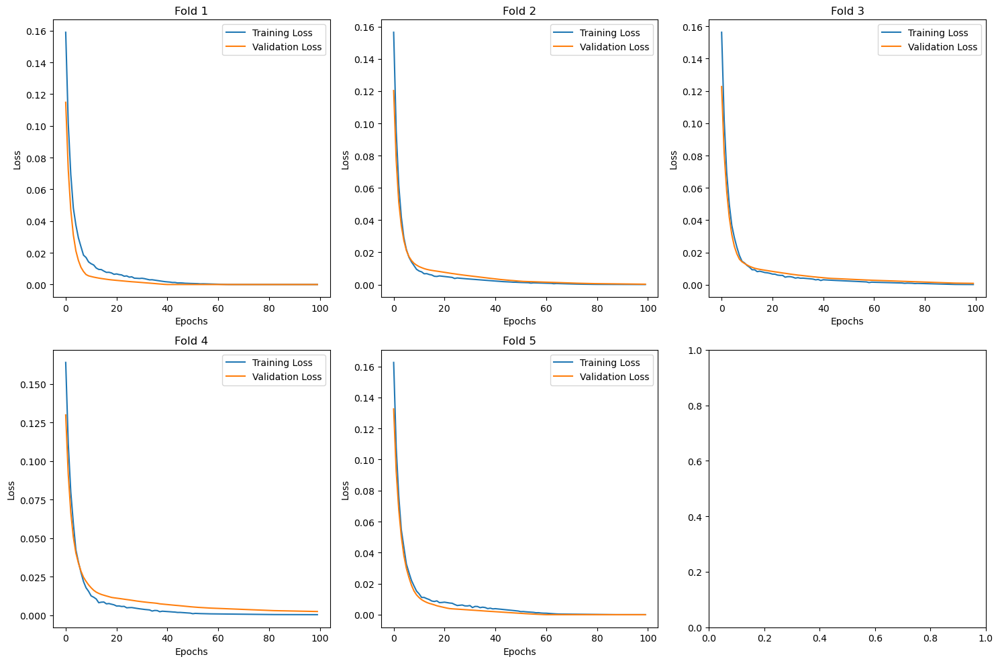

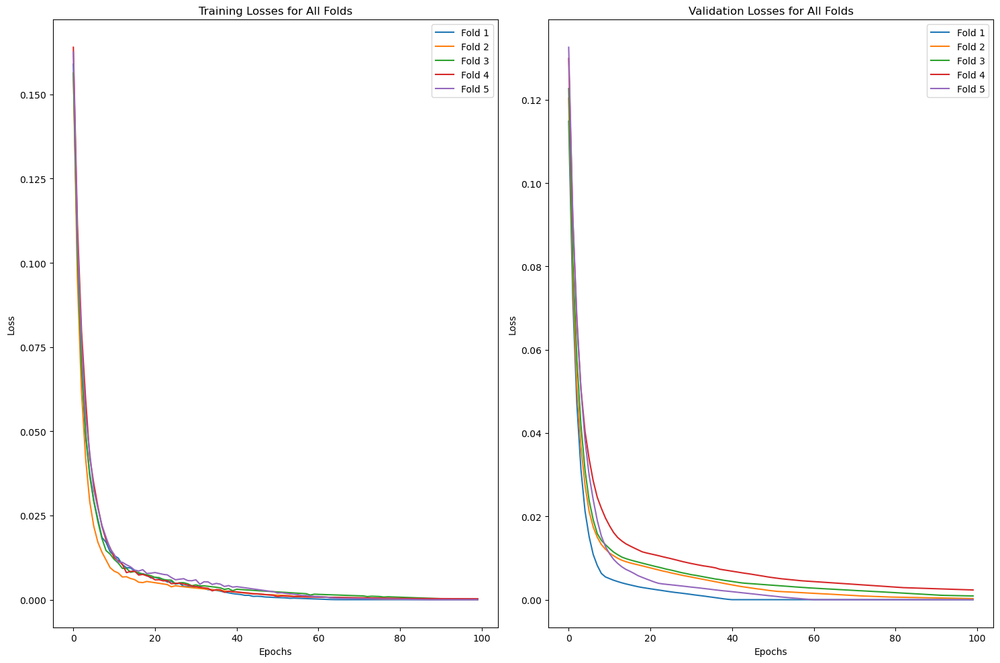

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_149"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_459 (Dense)               │ (None, 256)            │       512,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 528,836 (2.02 MB)

 Trainable params: 528,834 (2.02 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [90]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(256, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(64, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(256, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(64, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [91]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 541us/step - loss: 5.6528e-04


0.0009797130478546023

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.828


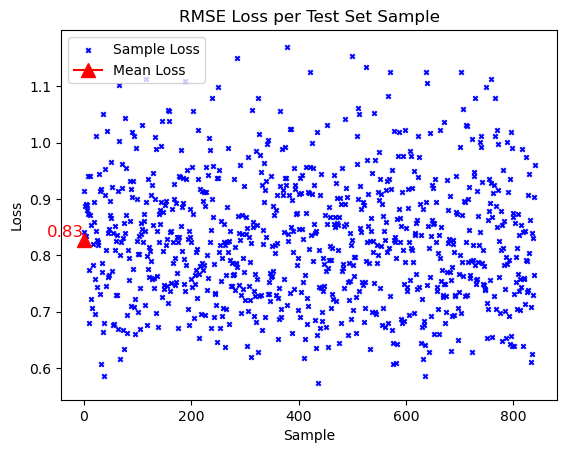

In [92]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### NN(2000, {1:256, 2:128, 3:64}, 2)


Epoch 1: val_loss improved from inf to 0.09840, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.09840 to 0.05268, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.05268 to 0.03051, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.03051 to 0.01895, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.01895 to 0.01248, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.01248 to 0.00904, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.00904 to 0.00768, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.00768 to 0.00681, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.00681 to 0.00604, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.00604 to 0.00530, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00530 to 0.00481, saving model to bes

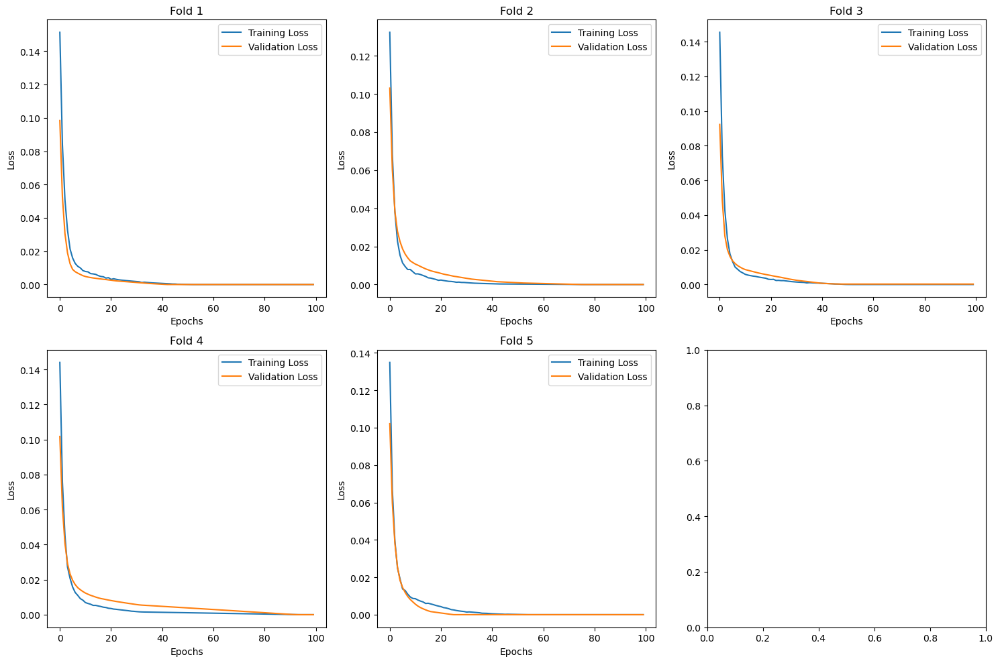

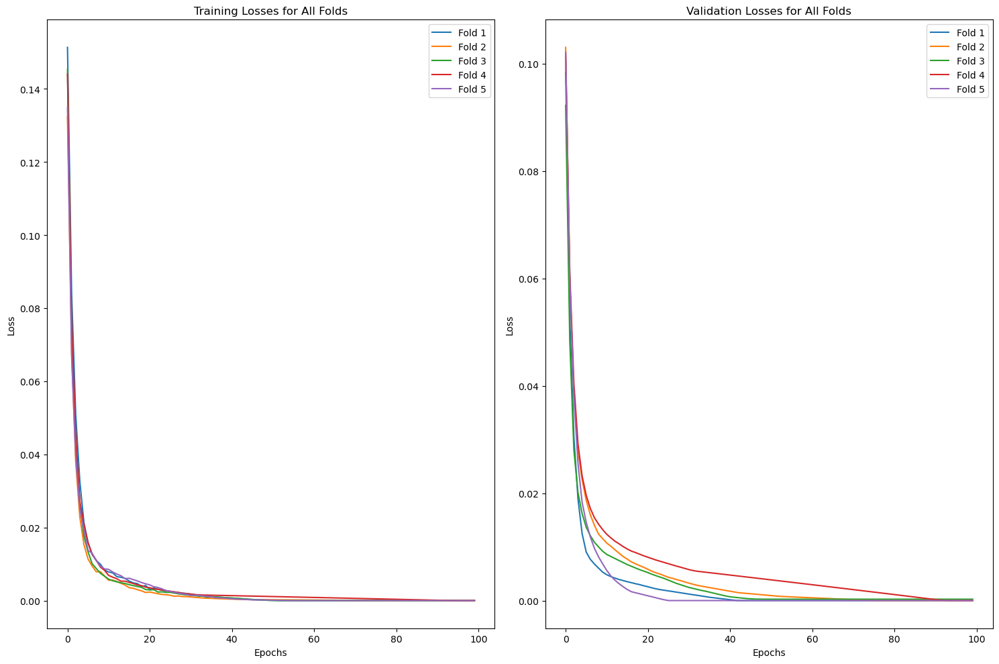

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_155"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_482 (Dense)               │ (None, 256)            │       512,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_483 (Dense)               │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 553,540 (2.11 MB)

 Trainable params: 553,538 (2.11 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [93]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(256, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dense(128, activation='tanh'))
    model.add(Dense(64, activation='tanh'))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()

# Load the best model weights
best_model = Sequential()
best_model.add(Dense(256, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dense(128, activation='tanh'))
best_model.add(Dense(64, activation='tanh'))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [94]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 626us/step - loss: 3.7026e-04


0.0006442632875405252

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Overall Mean Loss: 0.860


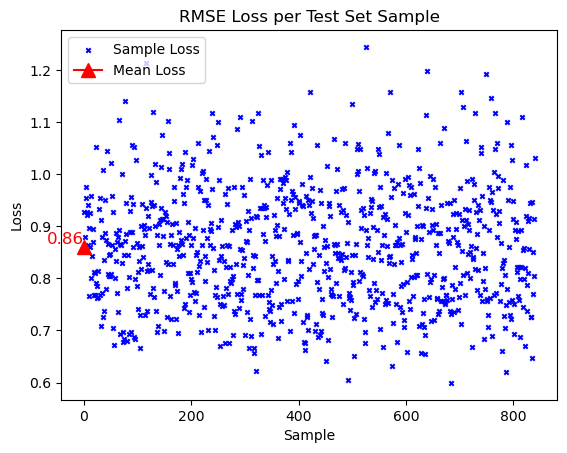

In [95]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


### Finding the Optimal Topology

In [106]:
# Read CSV data into a DataFrame
df1 = pd.read_csv("topologies_RMSE.csv", sep="'")



In [132]:
topologies_RMSE = []
for i in range(0, 26):
    Topology = df1.loc[i][0]
    topologies_RMSE.append(df1.loc[i][1])

In [135]:
topologies_RMSE

[';0.771;0.715;0.785;0.769;0.713;0.815;0.706;0.792;0.804;0.731',
 ';0.788;0.767;0.790;0.757;0.739;0.765;0.754;0.808;0.786;0.741',
 ';0.777;0.722;0.753;0.752;0.729;0.802;0.759;0.756;0.748;0.775',
 ';0.785;0.778;0.772;0.777;0.759;0.712;0.769;0.737;0.795;0.772',
 ';0.802;0.821;0.818;0.767;0.781;0.864;0.798;0.824;0.743;0.795',
 ';0.803;0.826;0.783;0.789;0.855;0.807;0.827;0.812;0.821;0.790',
 ';0.800;0.801;0.817;0.796;0.781;0.819;0.788;0.805;0.755;0.813',
 ';0.829;0.813;0.882;0.786;0.781;0.951;0.784;0.854;0.837;0.876',
 ';0.830;0.757;0.797;0.799;0.806;0.809;0.820;0.853;0.807;0.779',
 ';0.856;0.812;0.826;0.791;0.830;0.847;0.780;0.847;0.834;0.793',
 ';0.837;0.815;0.817;0.801;0.816;0.842;0.856;0.838;0.847;0.789',
 ';0.830;0.850;0.870;0.781;0.799;0.801;0.800;0.800;0.804;0.762',
 ';0.791;0.790;0.817;0.840;0.807;0.843;0.828;0.830;0.826;0.821',
 ';0.841;0.836;0.790;0.768;0.810;0.836;0.813;0.814;0.841;0.847',
 ';0.841;0.842;0.867;0.928;0.778;0.828;0.843;0.817;0.824;0.790',
 ';0.815;0.824;0.789;0.81

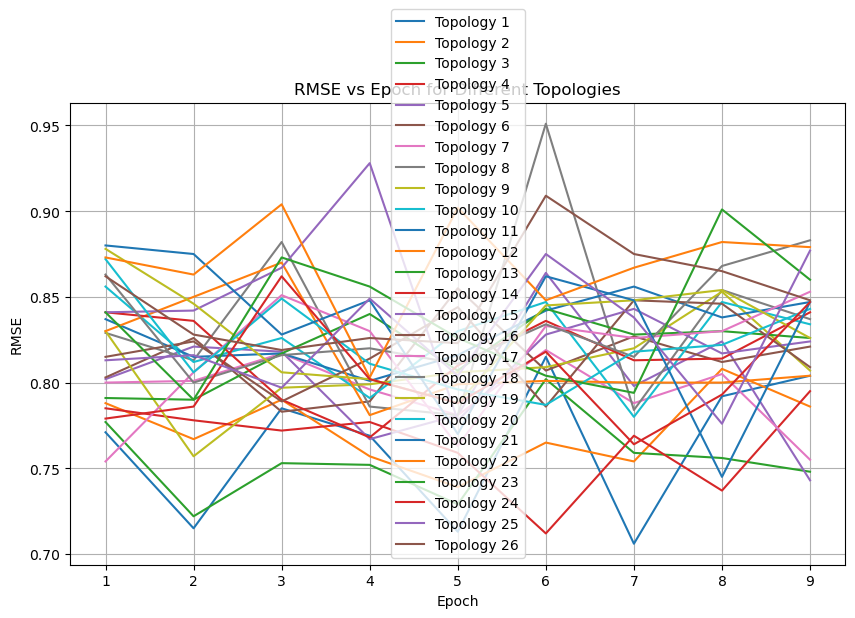

In [137]:
values = [[float(val) for val in topology.split(';')[1:-1]] for topology in topologies_RMSE]

# Plotting
plt.figure(figsize=(10, 6))
for i, topology_values in enumerate(values, start=1):
    plt.plot(range(1, len(topology_values)+1), topology_values, label=f'Topology {i}')

plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.title('RMSE vs Epoch for Different Topologies')
plt.legend()
plt.grid(True)
plt.show()

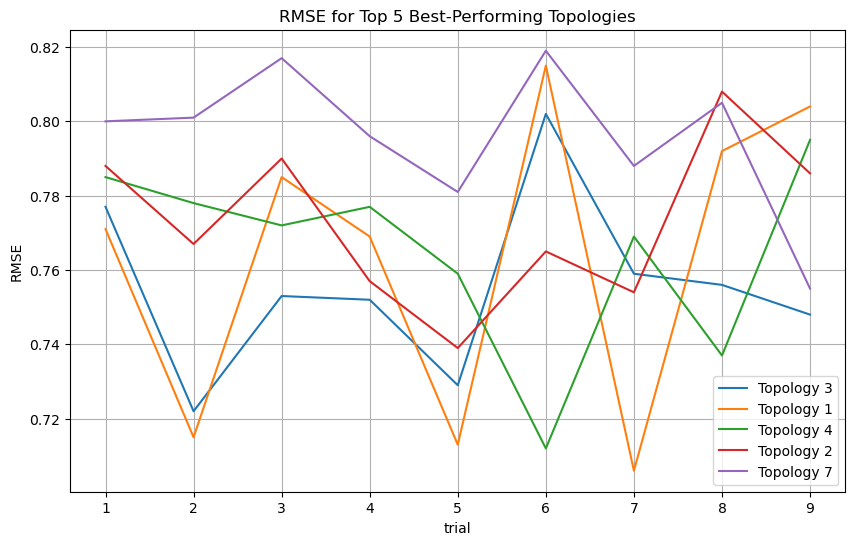

In [145]:

# Calculating average RMSE for each topology
avg_RMSE = [sum([float(val) for val in topology.split(';')[1:-1]]) / len(topology.split(';')[1:-1]) for topology in topologies_RMSE]

# Sorting topologies based on average RMSE values
sorted_indices = sorted(range(len(avg_RMSE)), key=lambda k: avg_RMSE[k])
top_5_indices = sorted_indices[:5]

# Extracting values for the top 5 topologies
top_5_values = [values[i] for i in top_5_indices]

# Plotting
plt.figure(figsize=(10, 6))
for i, topology_values in enumerate(top_5_values, start=1):
    plt.plot(range(1, len(topology_values)+1), topology_values, label=f'Topology {top_5_indices[i-1]+1}')

plt.xlabel('trial')
plt.ylabel('RMSE')
plt.title('RMSE for Top 5 Best-Performing Topologies')
plt.legend()
plt.grid(True)
plt.show()

In [146]:
topology_means = []
for topology in topologies_RMSE:
    values = [float(val) for val in topology.split(';')[1:-1]]
    mean_rmse = sum(values) / len(values)
    topology_means.append(mean_rmse)

# Compute overall mean across all topologies
overall_mean = sum(topology_means) / len(topology_means)

print("Mean RMSE for each topology:")
for i, mean_rmse in enumerate(topology_means, start=1):
    print(f"Topology {i}: {mean_rmse:.3f}")

print("\nOverall mean RMSE:", overall_mean)

Mean RMSE for each topology:
Topology 1: 0.763
Topology 2: 0.773
Topology 3: 0.755
Topology 4: 0.765
Topology 5: 0.802
Topology 6: 0.814
Topology 7: 0.796
Topology 8: 0.835
Topology 9: 0.809
Topology 10: 0.825
Topology 11: 0.830
Topology 12: 0.815
Topology 13: 0.819
Topology 14: 0.817
Topology 15: 0.841
Topology 16: 0.819
Topology 17: 0.816
Topology 18: 0.834
Topology 19: 0.833
Topology 20: 0.823
Topology 21: 0.834
Topology 22: 0.869
Topology 23: 0.838
Topology 24: 0.804
Topology 25: 0.827
Topology 26: 0.851

Overall mean RMSE: 0.8156239316239315


In [149]:
best_topology_index = topology_means.index(min(topology_means))

# Best-performing topology
best_topology = best_topology_index + 1

print("Best-performing topology:", best_topology)
print("Mean RMSE:", topology_means[best_topology_index])

Best-performing topology: 3
Mean RMSE: 0.7553333333333334


### Variations in learning rate & momentum for the Best performing Model


Epoch 1: val_loss improved from inf to 0.12905, saving model to best_model_fold_0.keras

Epoch 2: val_loss improved from 0.12905 to 0.09157, saving model to best_model_fold_0.keras

Epoch 3: val_loss improved from 0.09157 to 0.06620, saving model to best_model_fold_0.keras

Epoch 4: val_loss improved from 0.06620 to 0.04901, saving model to best_model_fold_0.keras

Epoch 5: val_loss improved from 0.04901 to 0.03590, saving model to best_model_fold_0.keras

Epoch 6: val_loss improved from 0.03590 to 0.02698, saving model to best_model_fold_0.keras

Epoch 7: val_loss improved from 0.02698 to 0.02048, saving model to best_model_fold_0.keras

Epoch 8: val_loss improved from 0.02048 to 0.01578, saving model to best_model_fold_0.keras

Epoch 9: val_loss improved from 0.01578 to 0.01222, saving model to best_model_fold_0.keras

Epoch 10: val_loss improved from 0.01222 to 0.00974, saving model to best_model_fold_0.keras

Epoch 11: val_loss improved from 0.00974 to 0.00794, saving model to bes

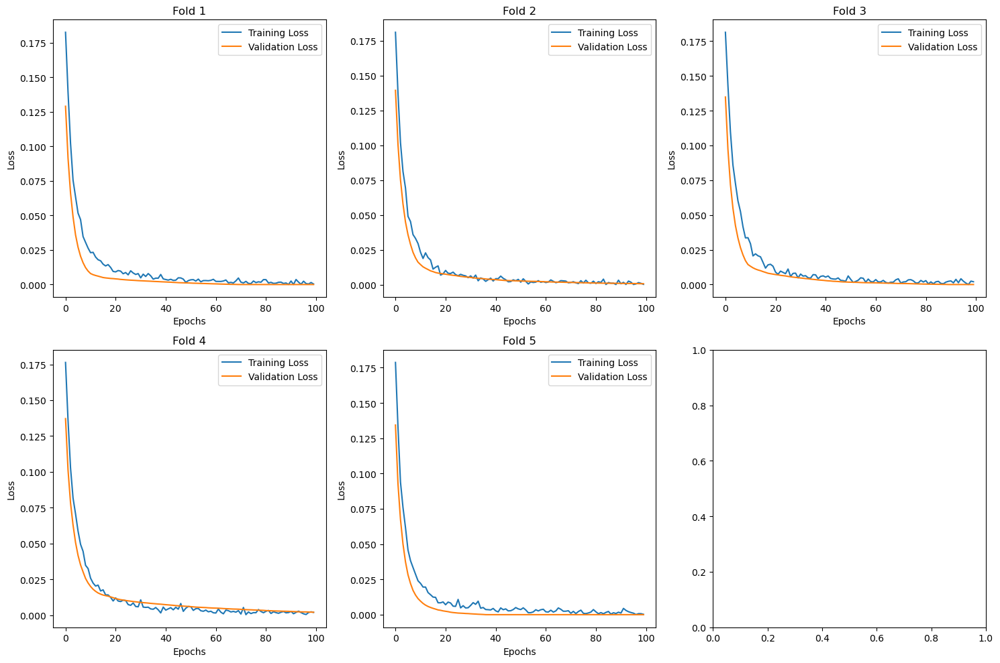

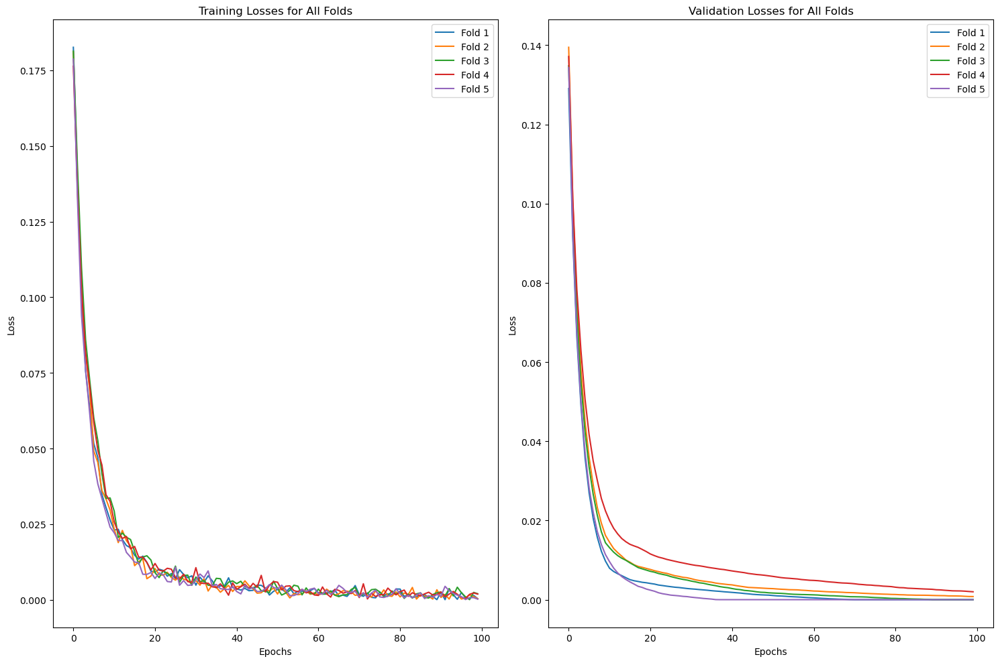

Best model index: 1, Best validation RMSE: 0.000
Deleted: best_model_fold_0.keras
Deleted: best_model_fold_2.keras
Deleted: best_model_fold_3.keras
Deleted: best_model_fold_4.keras


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │       128,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_38 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_39 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 132,356 (517.02 KB)

 Trainable params: 132,354 (517.01 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [36]:
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.models import Sequential
from keras.layers import Dense, Dropout
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import os
from keras.callbacks import EarlyStopping

# Assuming you have defined X_train_vect, scaled_labels_train, and rmse_custom

# 5-Fold Cross Validation performing on the training set
rmseTrain = []
rmseValidation = []
rmse1 = []

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create subplots with 3 columns and 2 rows
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

best_val_loss = float('inf')  # Initialize with a very large value
best_model_weights = None  # Initialize with None
best_model_index = None  # Initialize with None

stop = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=15, restore_best_weights=True)

for i, (train, test) in enumerate(kfold.split(X_train_vect)):
    X_train_fold, X_test_fold = X_train_vect[train], X_train_vect[test]
    y_train_fold, y_test_fold = scaled_labels_train[train], scaled_labels_train[test]

    # Define the model
    model = Sequential()
    model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
    model.add(Dropout(0.8))
    model.add(Dense(64, activation='tanh'))
    model.add(Dropout(0.2))
    model.add(Dense(2, activation='linear'))

    # Compile the model with SGD optimizer
    optimizer = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
    model.compile(loss=rmse_custom, optimizer=optimizer)

    # Callback to save best model weights
    checkpoint = ModelCheckpoint(filepath=f"best_model_fold_{i}.keras", monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    # Fit the model
    history = model.fit(X_train_fold,
                        y_train_fold,
                        validation_data=(X_test_fold, y_test_fold),
                        epochs=100, 
                        batch_size=32, 
                        verbose=0,
                        callbacks=[checkpoint])  # Add the checkpoint callback

    # Plot the loss
    row_index = i // 3  # Calculate the row index for the subplot
    col_index = i % 3   # Calculate the column index for the subplot
    axs[row_index, col_index].plot(history.history['loss'], label='Training Loss')
    axs[row_index, col_index].plot(history.history['val_loss'], label='Validation Loss')
    axs[row_index, col_index].set_title(f'Fold {i+1}')
    axs[row_index, col_index].set_xlabel('Epochs')
    axs[row_index, col_index].set_ylabel('Loss')
    axs[row_index, col_index].legend()

    # Evaluate the model
    val_loss = history.history['val_loss'][-1]  # Get the validation loss from the last epoch
    vallos = history.history['val_loss']
    rmse1.append(vallos)
    rmseValidation.append(val_loss)
    print(f'Fold: {i+1}, Validation RMSE: {val_loss:.3f}')

    # Check if current model has the lowest validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_index = i

    # Store training loss
    rmseTrain.append(history.history['loss'])

plt.tight_layout()
plt.show()

fig1, axs1 = plt.subplots(1, 2, figsize=(15, 10))

# Plot all training losses

for i in range(len(rmseTrain)):
    axs1[0].plot(rmseTrain[i], label=f'Fold {i+1}')
axs1[0].set_title('Training Losses for All Folds')
axs1[0].set_xlabel('Epochs')
axs1[0].set_ylabel('Loss')
axs1[0].legend()



for i in range(len(rmseValidation)):
    axs1[1].plot(rmse1[i], label=f'Fold {i+1}')
axs1[1].set_title('Validation Losses for All Folds')
axs1[1].set_xlabel('Epochs')
axs1[1].set_ylabel('Loss')
axs1[1].legend()
plt.tight_layout()
plt.show()


# Load the best model weights
best_model = Sequential()
best_model.add(Dense(64, input_dim=X_train_vect.shape[1], activation='tanh'))
best_model.add(Dropout(0.8))
best_model.add(Dense(64, activation='tanh'))
best_model.add(Dropout(0.2))
best_model.add(Dense(2, activation='linear'))

# Load the weights of the best model
best_model.load_weights(f"best_model_fold_{best_model_index}.keras")

opt = SGD(learning_rate=0.001, momentum=0.0, nesterov=False)
best_model.compile(loss=rmse_custom, optimizer=opt)

best_model.fit(X_train_vect, scaled_labels_train, epochs=10, batch_size=32, verbose=0)

# Now best_model contains the weights and biases corresponding to the best fold
print(f'Best model index: {best_model_index+1}, Best validation RMSE: {best_val_loss:.3f}')

# Delete other model files
for i in range(0, 5): 
    if i != best_model_index + 1:
        file_path = f"best_model_fold_{i}.keras"
        if os.path.exists(file_path):
            os.remove(file_path)
            print(f"Deleted: {file_path}")

best_model.summary()


In [37]:
best_model.evaluate(X_test_vect, scaled_labels_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 4.6816e-04


0.0008146062609739602

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Overall Mean Loss: 0.904


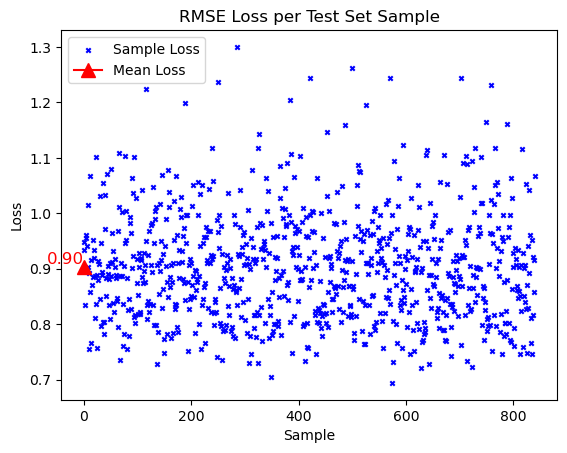

In [38]:
# Get predictions for the test set
predictions = best_model.predict(X_test_vect)

# Calculate loss for each sample
sample_losses = np.sqrt(np.mean(np.square(predictions - scaled_labels_test), axis=1))

# Calculate overall mean loss
mean_loss = np.mean(sample_losses)

print(f'Overall Mean Loss: {mean_loss:.3f}')


# plt.plot(sample_losses)
plt.scatter(range(len(sample_losses)), sample_losses, s=10, marker='x', color='blue')

# plt.imshow(sample_losses)
plt.plot(mean_loss, marker='^', markersize=10, color='red') 
plt.title('RMSE Loss per Test Set Sample')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.text(0.5, mean_loss, f'{mean_loss:.2f}', color='red', fontsize=12, ha='right', va='bottom')
plt.legend(['Sample Loss', 'Mean Loss'])
plt.show()


In [ ]:
print(f'Took {(time() - time_start) / 60:.2f} minutes!')